# Notebook Version: 19.10.2000 Gernot
## Changelog:

introduced 3 global variables:
* channels: which just stand for the channel names so we can slice them conveniently in pandas no matter how the dataframe looks
* labels: are the different viruses we can detect
* default_features = channels

I created the function make_labels, which checks how many different combinations of labels there are (double positives, triple positives, etc...) and then encodes it into integers.

pairwise_plots_labels then plots the data with those labels

I changed the logic of the plotting functions: they now require "features" as an argument: this specifies what columns of the pd dataframe DB Scan should be run on (because for TSNE, UMAP, etc... it can be different from just the channels).

I created a few functions which transform the datasets in certain ways (scaling, decorrelation, etc...)

I removed some unnecessary plots and added other, more interesting ones.

In [1]:
import numpy as np
import pandas as pd
import sklearn.cluster as cl
import matplotlib.pyplot as plt
import itertools
from typing import Dict
import data_lib

In [2]:
import umap
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

In [3]:
# print available data summary
_ = data_lib.explore_datasets(datafolder="../Data",verbose=True)

----------------------------------------------------------------------------------------------
-- The following 4 groups were found
-- They contain 40 datasets
-- The first printed entity is the key to the returned dictionary
-----------------------------------
Group: ../Data/6P-positive-dilution-series-labelled/droplet-level-data/RawData
po-di-se-B8, files: 13                  po-di-se-C8, files: 13                  po-di-se-A8, files: 13
po-di-se-D8, files: 13                                                          
-----------------------------------
Group: ../Data/6P-positive-dilution-series-2-labelled/droplet-level-data/RawData
po-di-se-2-C4, files: 13                po-di-se-2-A1, files: 13                po-di-se-2-C1, files: 13
po-di-se-2-A4, files: 13                po-di-se-2-B1, files: 13                po-di-se-2-D4, files: 13
po-di-se-2-D1, files: 13                po-di-se-2-B4, files: 13                
-----------------------------------
Group: ../Data/6P-positive-dilu

In [4]:
labels = ["IAV-M_POS",
             "IBV-M_POS",
             "MHV_POS",
             "RSV-N_POS",
             "SARS-N1_POS",
             "SARS-N2_POS"]

In [5]:
def pairwise_plots_labels(df: pd.DataFrame) -> None:
    '''
    Takes pandas DataFrame as input that contains the 6 color channels as columns as well as a column called
    "numerical_label"; proceeds to draw all possible 2 dimensional scatter plots.
    '''
    combinations = itertools.combinations(df[channels], 2)
    fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
    fig.set_figheight(15)
    fig.set_figwidth(15)
    for i, combination in enumerate(combinations): 
        X = df.loc[:, combination]
        X = X.to_numpy()

        ax[i //3, i %3].set_xlabel(combination[0])
        ax[i //3, i %3].set_ylabel(combination[1])
        ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = df["numerical_label"])
    fig.tight_layout()

In [6]:
def make_labels(df: pd.DataFrame, return_dict = False):
    '''
    Operates inplace on the given DataFrame.
    Looks for all different label combinations, adds those to a label column.
    Then creates a numerical_label column which encodes those string labels into integers.
    '''
    labels = []
    for j in range(len(df)):
        row = df.loc[j][6:]
        keys = row.keys()
        label = ""
        for i in range(len(row)):
            if row[i] == 1:
                label += f" {keys[i]}"
        if not label:
            label = "None"
        labels.append(label.strip())

    df["label"] = labels
    
    color_dict = {}
    i = 0
    for label in set(labels):
        color_dict[label] = i
        i += 1
    df["numerical_label"] = df["label"].apply(lambda x: color_dict.get(x))

    if return_dict:
        return df, color_dict
    
    return df

In [7]:
def rescale_dataset(df, features):
    scaler = MinMaxScaler()
    df[features] = scaler.fit_transform(df[features])
    return df

In [8]:
def decorrelate_dataset(df, features):
    pca = PCA(whiten=True)
    df[features] = pca.fit_transform(df[features])
    return df

In [9]:
def umap_transform_dataset(df, features):
    reducer = umap.UMAP()
    df[["umap1", "umap2"]] = reducer.fit_transform(df[features])

In [10]:
def tsne_transform_dataset(df, features, n_components = 2, perplexity = 15):
    tsne = TSNE(n_components=n_components, learning_rate='auto', init='random', perplexity=perplexity)
    df[[f"tsne{i+1}" for i in range(n_components)]] = tsne.fit_transform(df[features])

# DB Scan

In [11]:
channels = ['Chan1_FluoValue', 'Chan2_FluoValue', 'Chan3_FluoValue',
       'Chan4_FluoValue', 'Chan5_FluoValue', 'Chan6_FluoValue']
default_features = channels

In [12]:
def do_db_scan_preds(X: np.array, eps: float, min_samples: int):
    classifier = cl.DBSCAN(eps = eps, min_samples = min_samples)
    preds = classifier.fit_predict(X)
    return preds

In [13]:
def pairwise_plots_dbscan(df, features, eps: float, min_samples: int = 5):
    
    np_features = df[features].to_numpy() # grab features to cluster on
    preds = do_db_scan_preds(np_features, eps, min_samples) # get clusters
    
    print(f"Number of outliers: {len([x for x in preds if x == -1])}") # print number of outliers
    print(f"Number of clusters: {max(preds)+1}") # print number of clusters
    
    
    combinations = itertools.combinations(df[channels].columns, 2)
    fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
    fig.set_figheight(15)
    fig.set_figwidth(15)
    for i, combination in enumerate(combinations): 
        np_features = df.loc[:, combination]
        np_features = np_features.to_numpy()

        ax[i //3, i %3].set_xlabel(combination[0])
        ax[i //3, i %3].set_ylabel(combination[1])
        ax[i //3, i %3].scatter(np_features[:, 0], np_features[:, 1], c = preds)
    fig.tight_layout()

## A3 Dataset

Number of outliers: 23
Number of clusters: 5


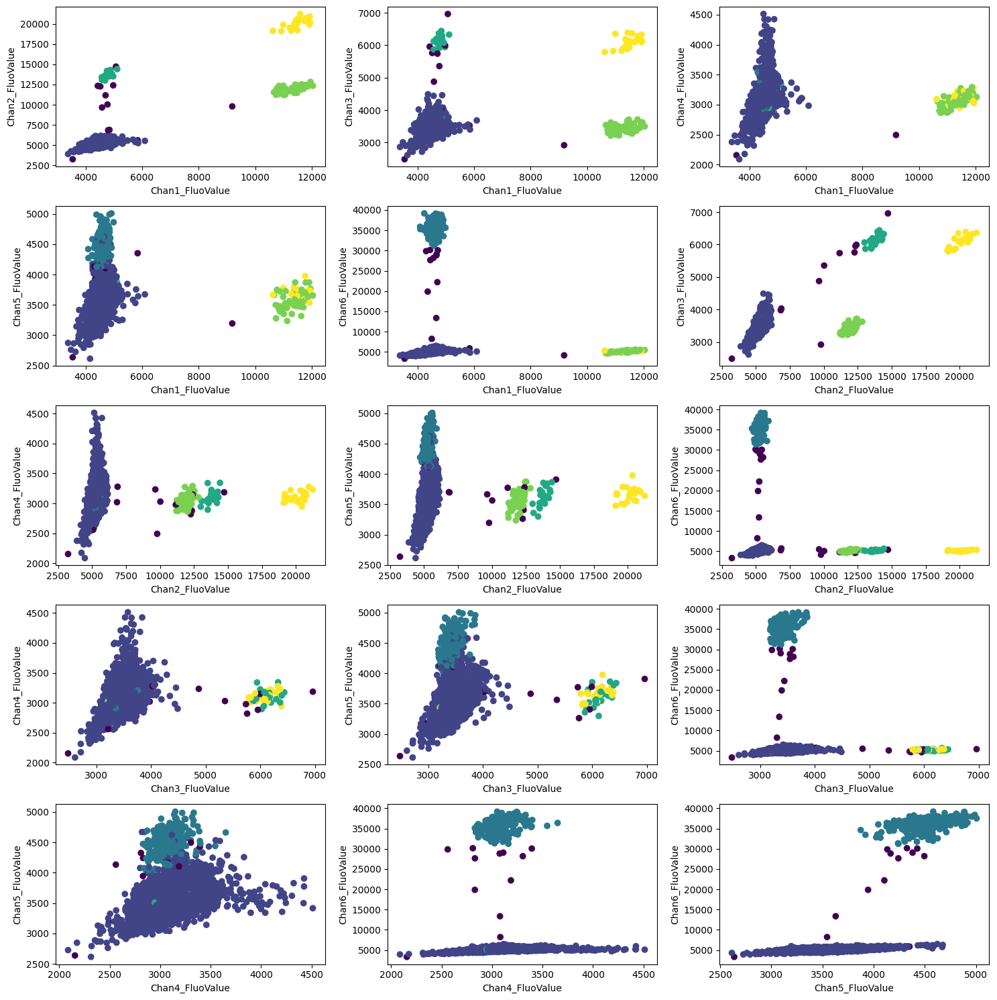

In [14]:
df = data_lib.load_dataset(labels, ["wa-sa-A3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

## B3 Dataset

Number of outliers: 33
Number of clusters: 5


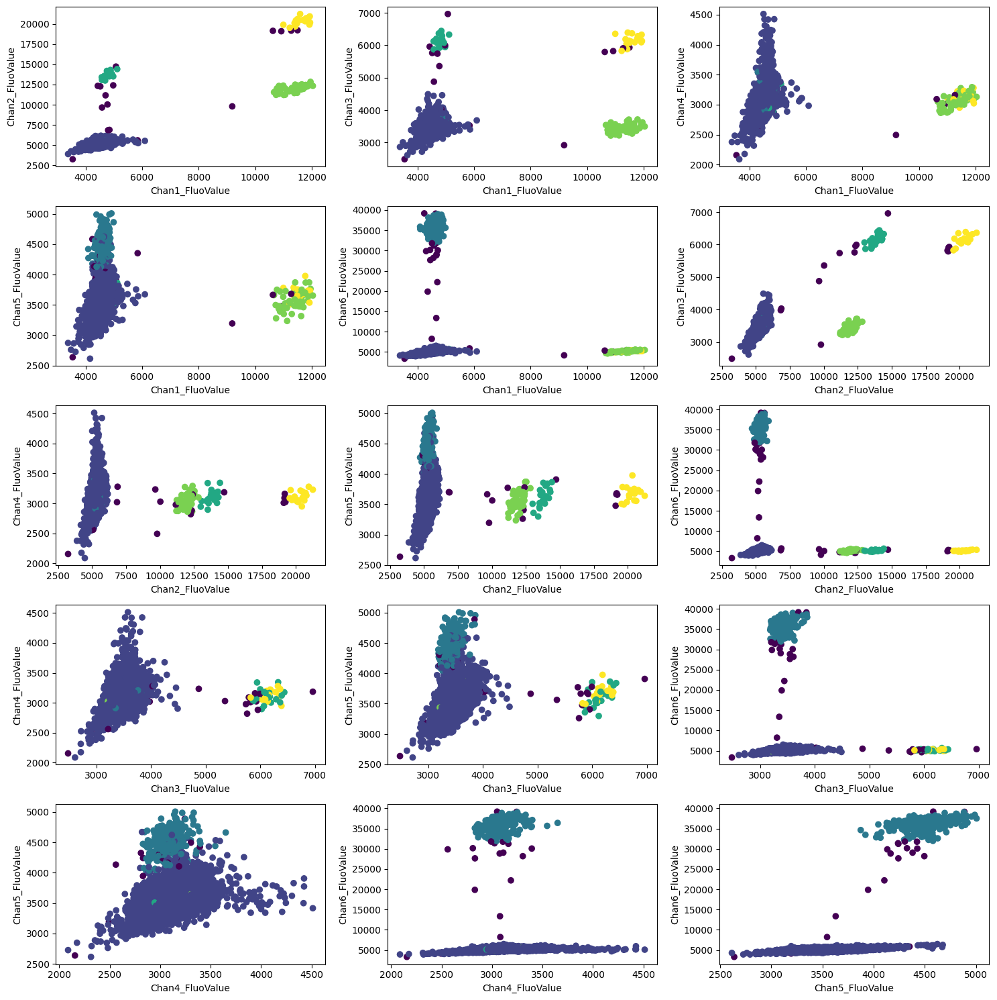

In [15]:
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 10)

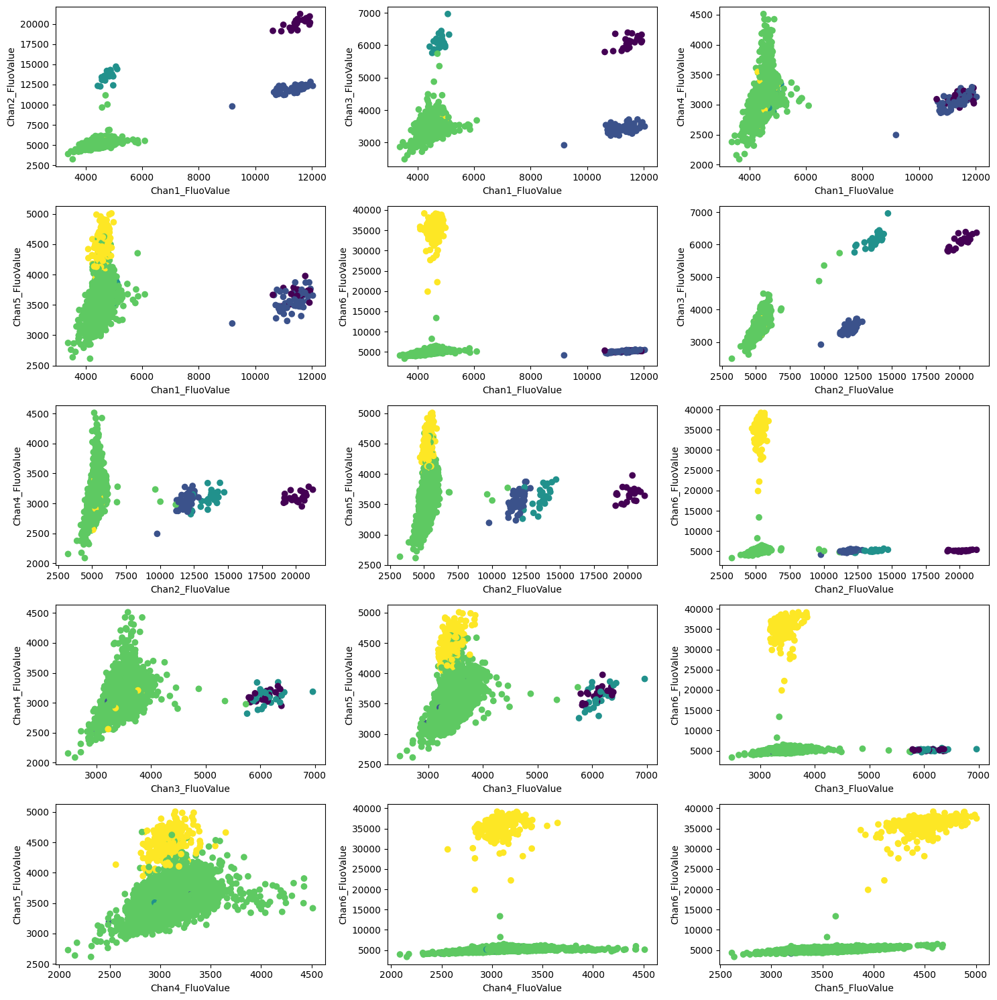

In [16]:
make_labels(df)
pairwise_plots_labels(df)

## C3 Dataset (POSITIVE CONTROL)

Number of outliers: 229
Number of clusters: 25


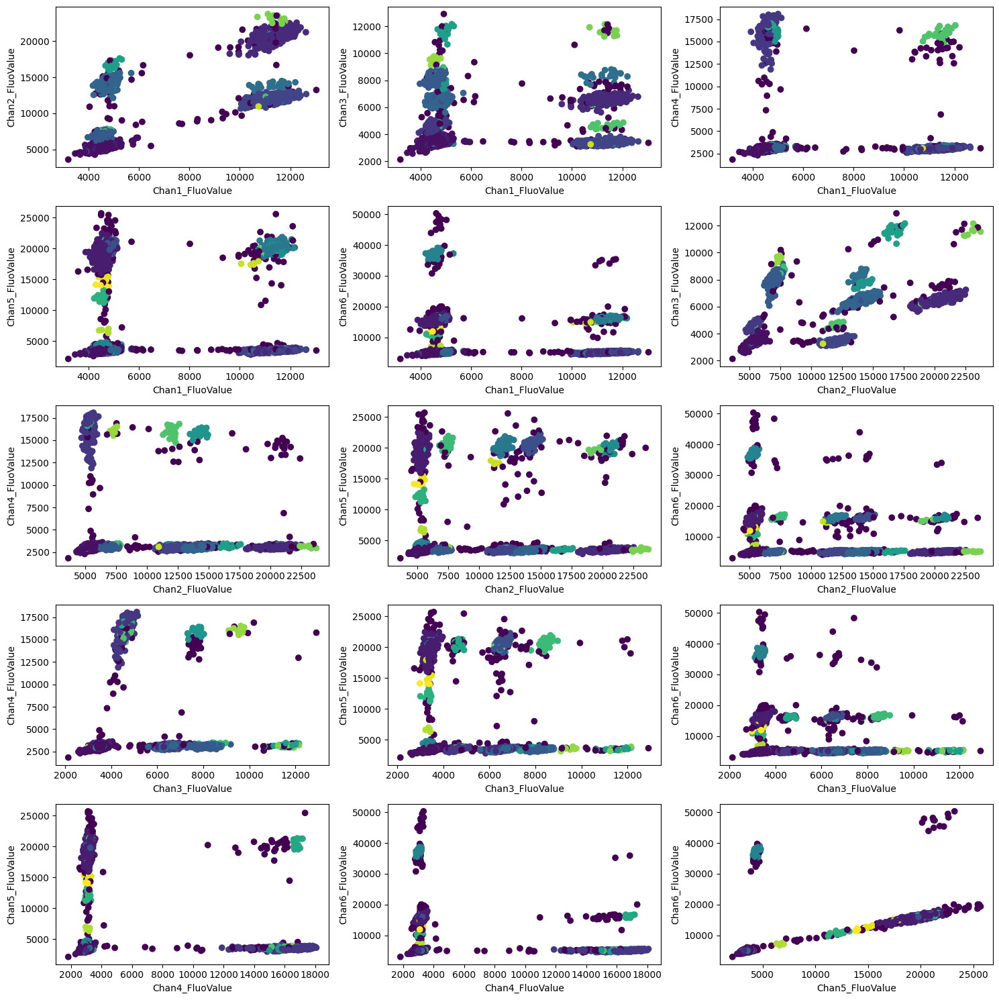

In [17]:
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

Number of clusters in the original data: 39


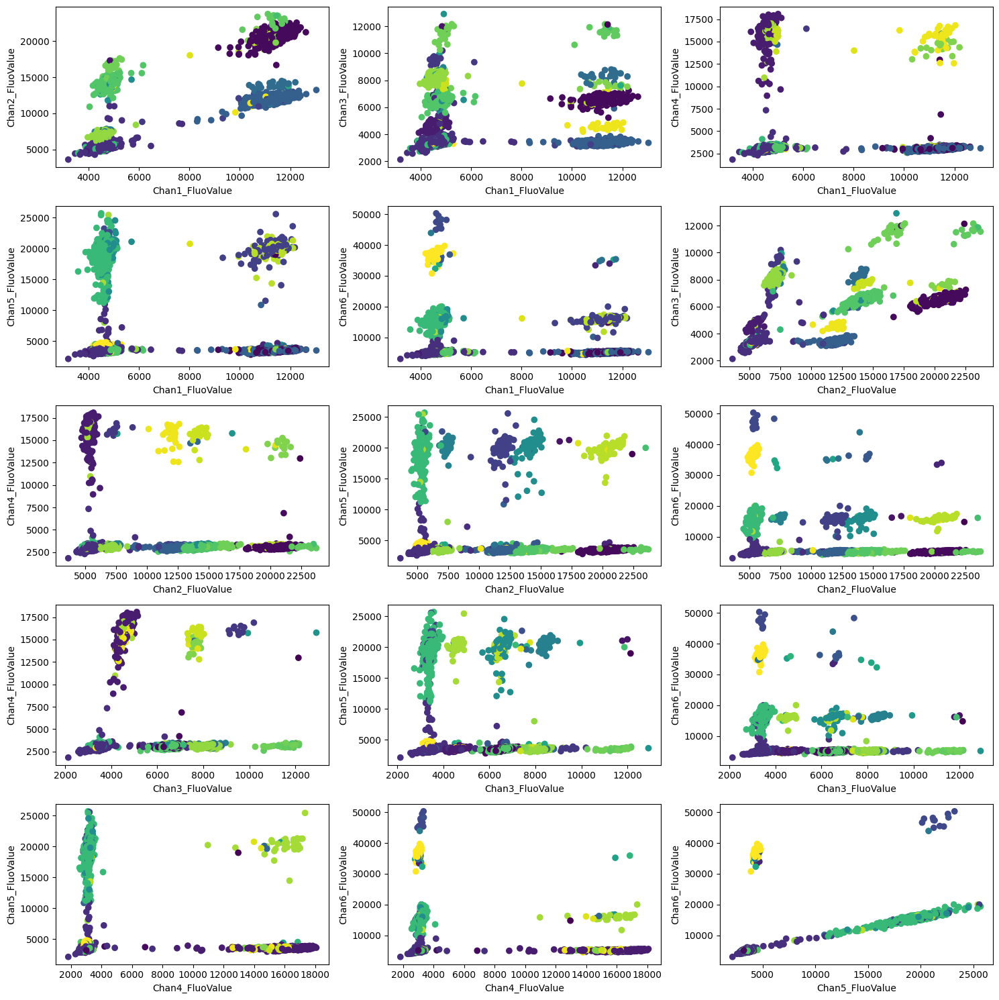

In [18]:
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))+1}")
pairwise_plots_labels(df)

In [19]:
counts = df["label"].value_counts()
counts = counts.drop(counts[counts <= 5].index)
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 21


### C3 Dataset with preprocessing data

Number of outliers: 57
Number of clusters: 21


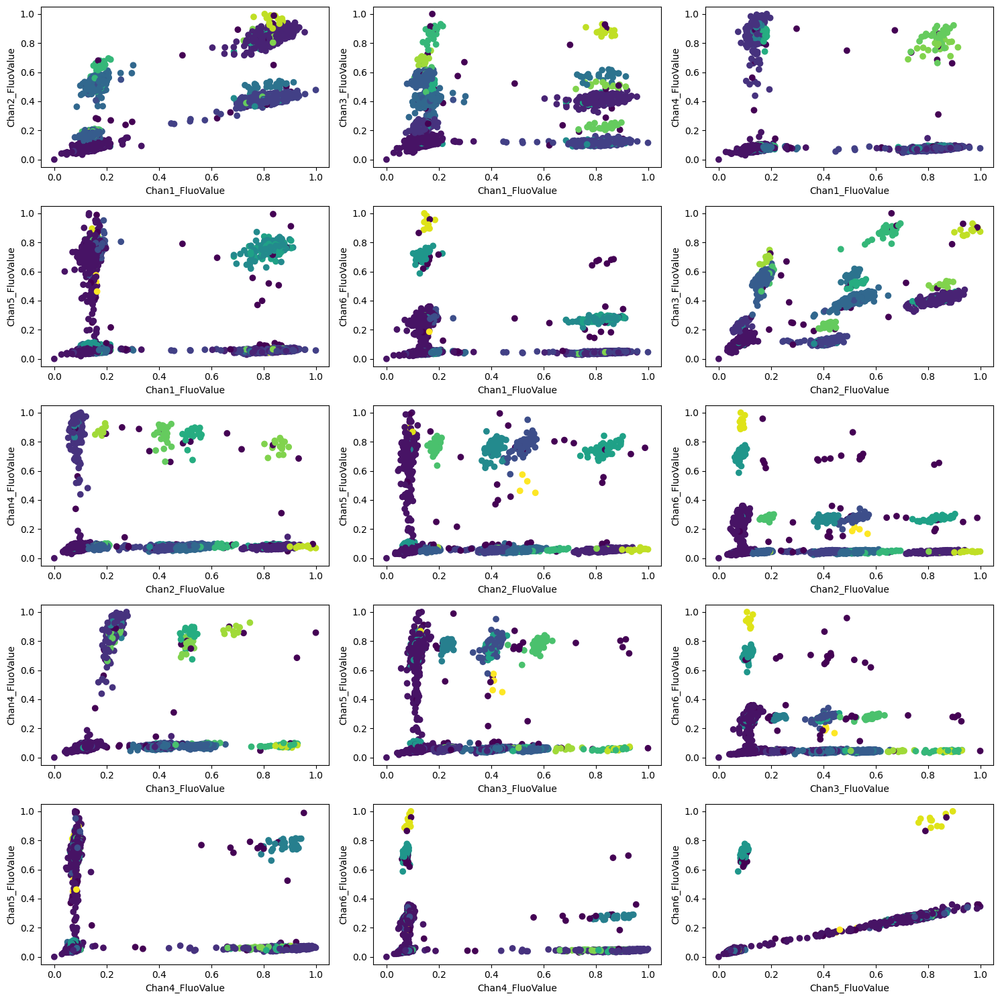

In [20]:
# scaling to [0, 1]
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
df = rescale_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = default_features, eps = 0.1, min_samples = 5)

Number of outliers: 45
Number of clusters: 21


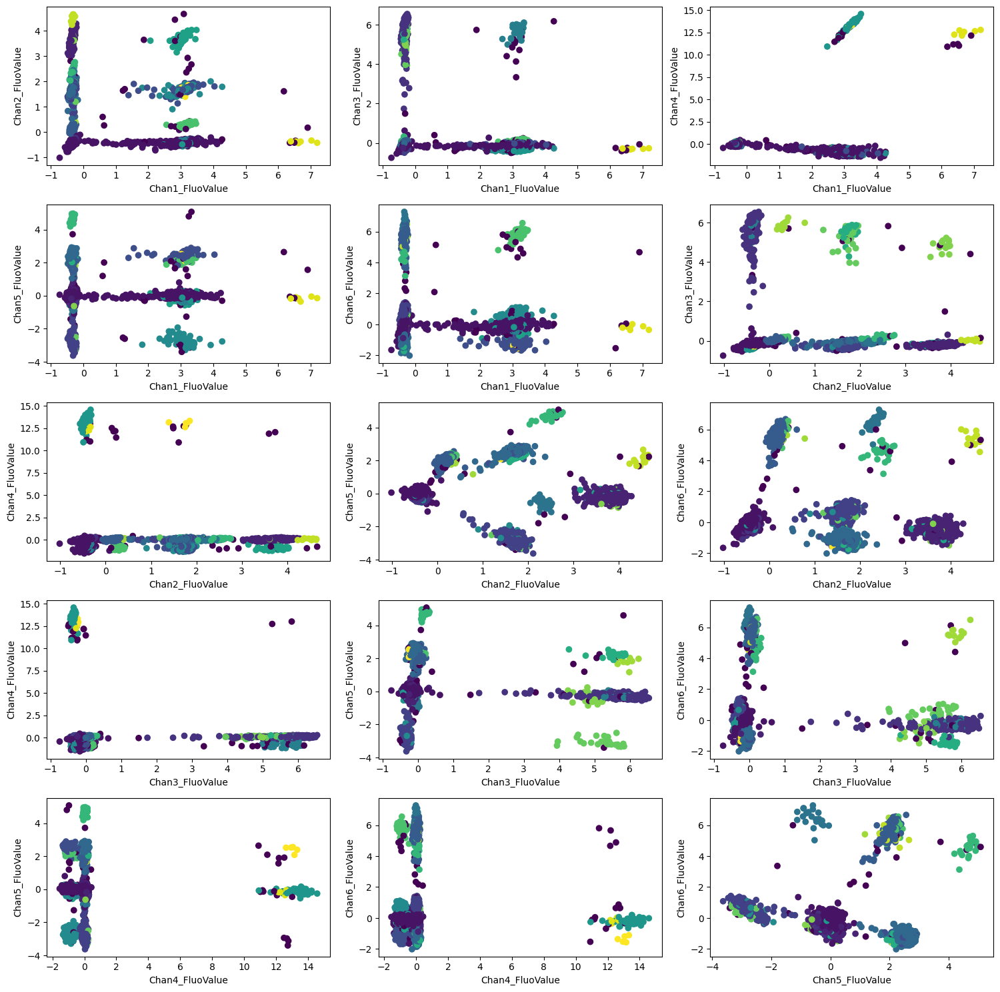

In [21]:
# PCA decorrelation
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
decorrelate_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = default_features, eps = 0.85, min_samples = 5)

/home/gernot/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Number of outliers: 0
Number of clusters: 22


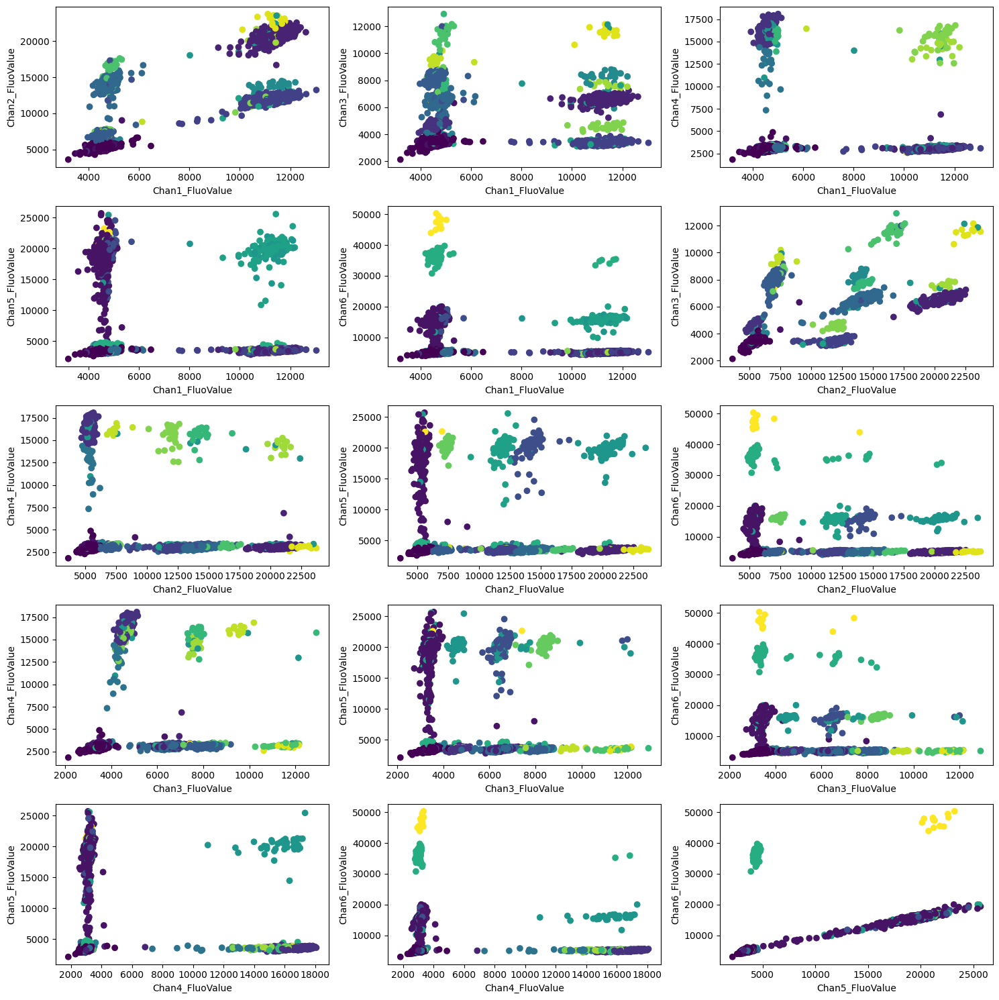

In [22]:
# UMAP 
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
umap_transform_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.85, min_samples = 5)

Number of outliers: 0
Number of clusters: 21


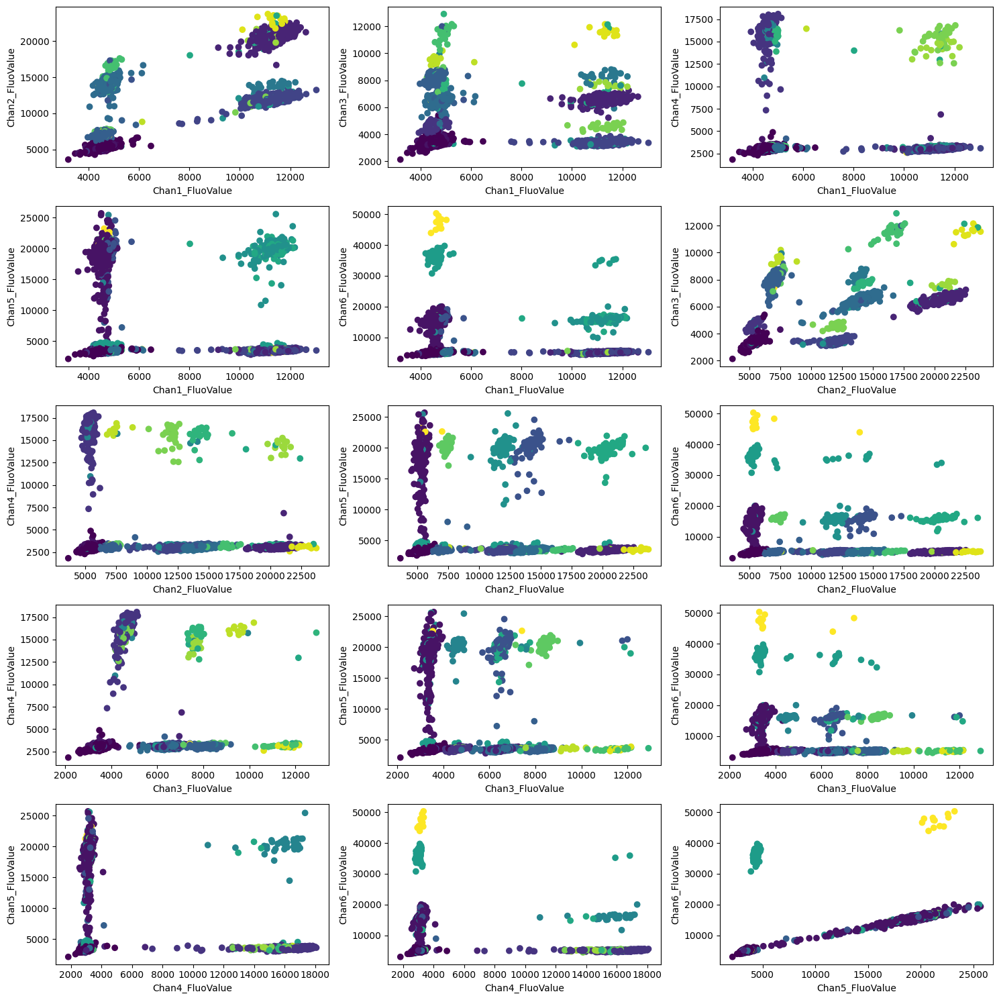

In [23]:
# TSNE 2 components (2d)
df = data_lib.load_dataset(labels, ["wa-sa-C3"], "../Data")
tsne_transform_dataset(df, features = default_features, n_components = 2)
pairwise_plots_dbscan(df, features = ["tsne1", "tsne2"], eps = 6, min_samples = 5)

### DB Scan on D3 Dataset (NEGATIVE CONTROL)

Number of outliers: 12
Number of clusters: 1


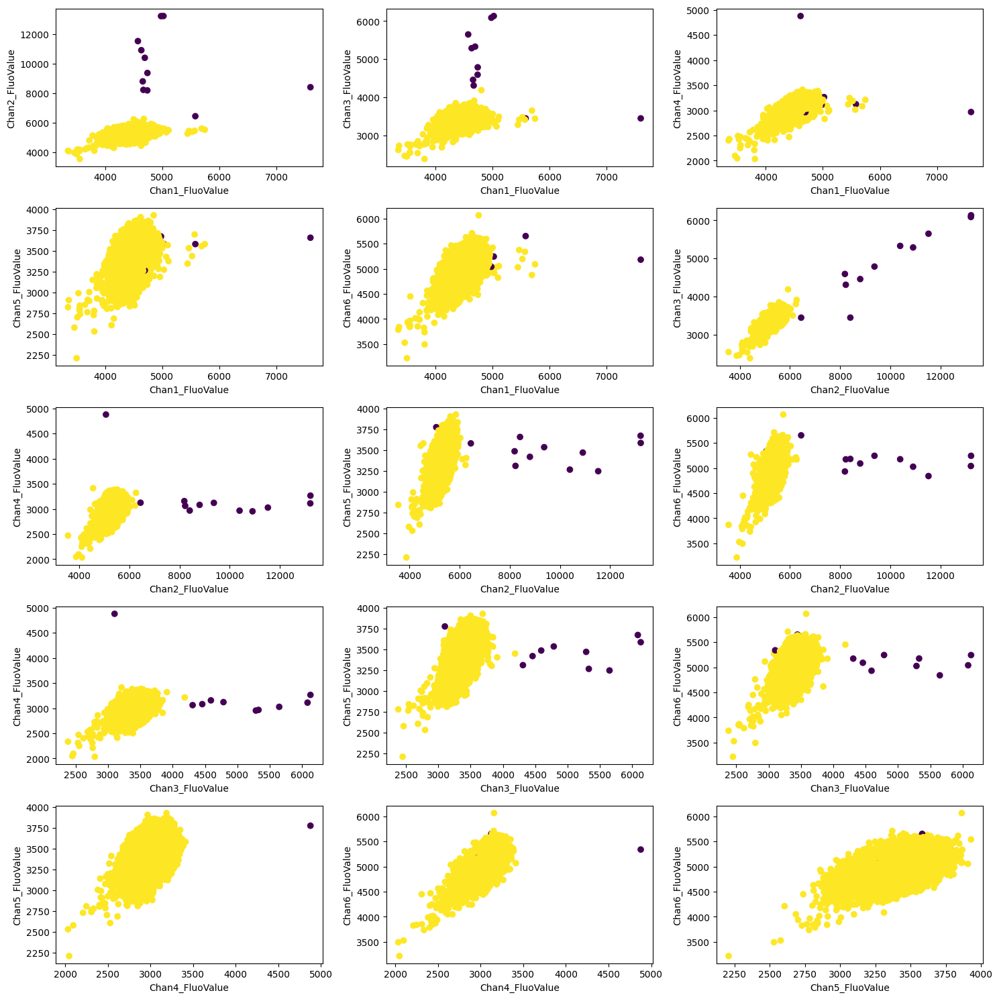

In [24]:
# vanilla way
df = data_lib.load_dataset(labels, ["wa-sa-D3"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

Number of clusters in the original data: 2


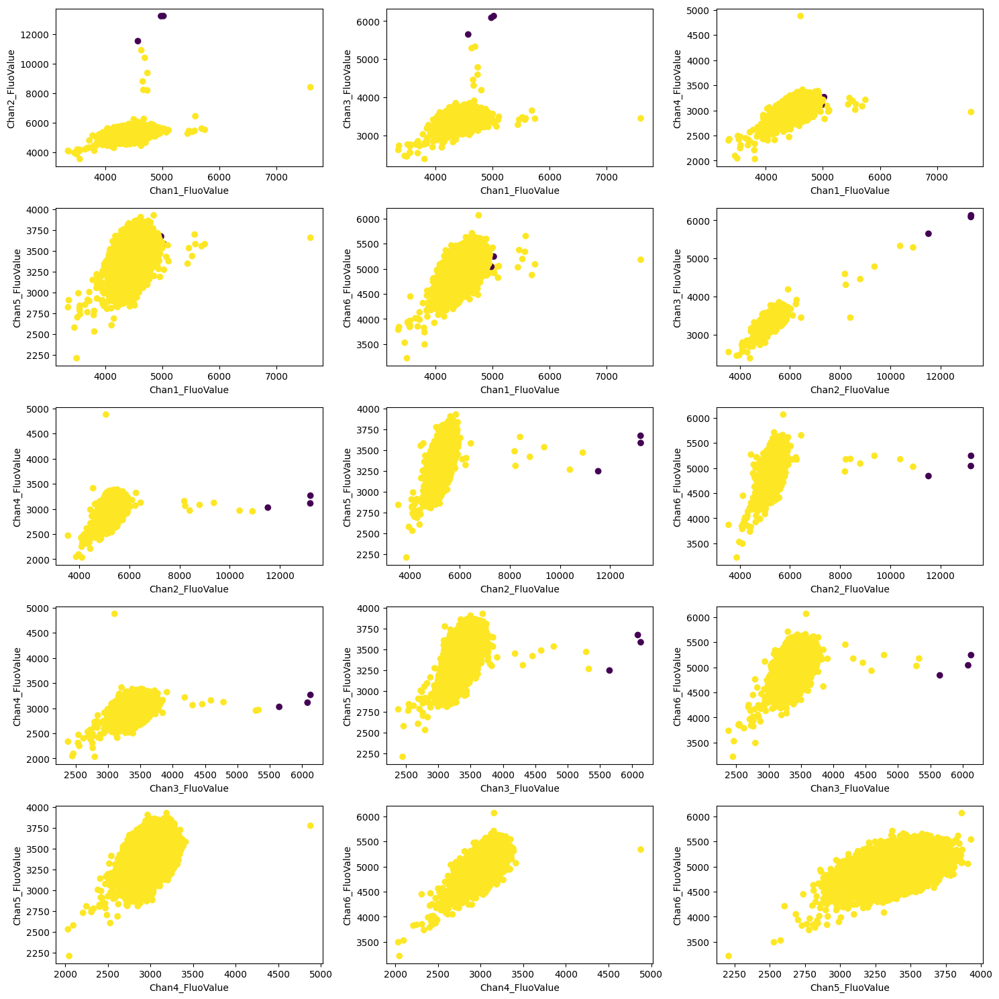

In [25]:
df = data_lib.load_dataset(labels, ["wa-sa-D3"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

In [26]:
counts = df["label"].value_counts()
counts = counts.drop(counts[counts <= 5].index)
counts
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 1


### DB Scan on C2 Dataset

Number of outliers: 16
Number of clusters: 4


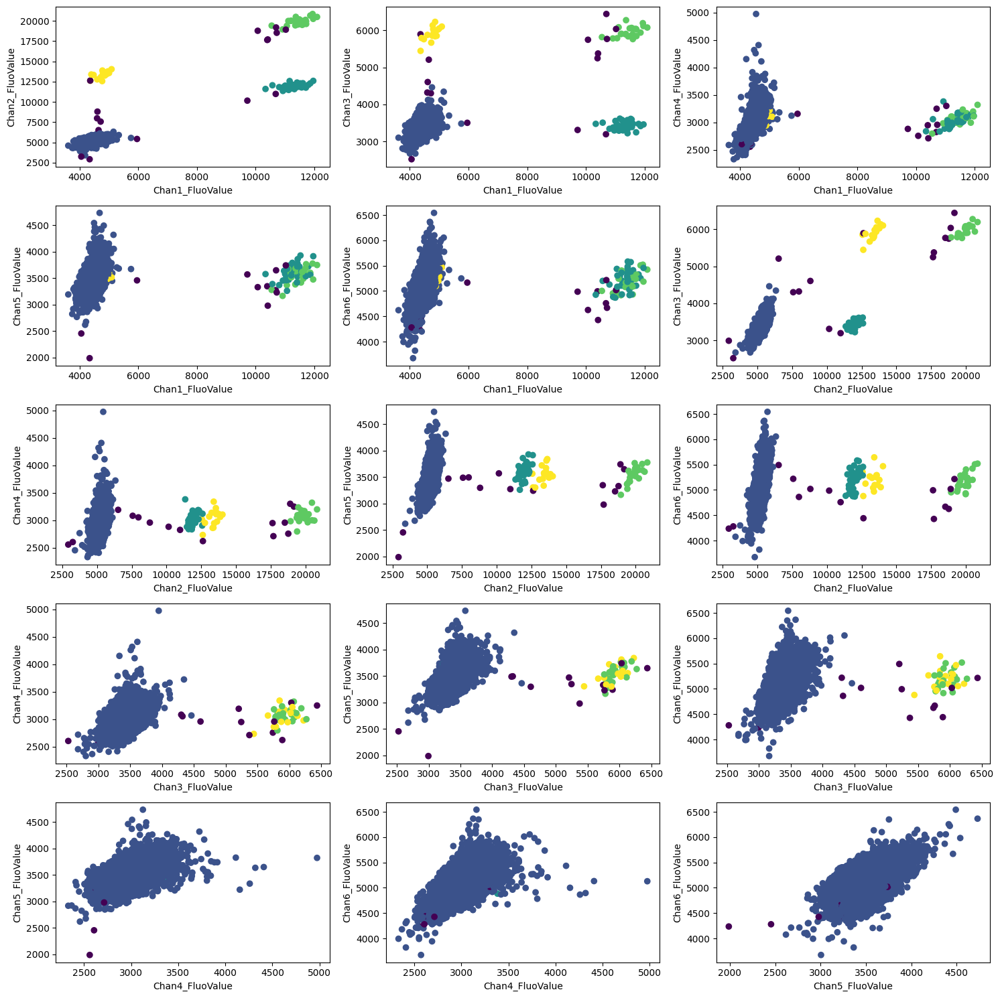

In [28]:
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 5)

Number of clusters in the original data: 4


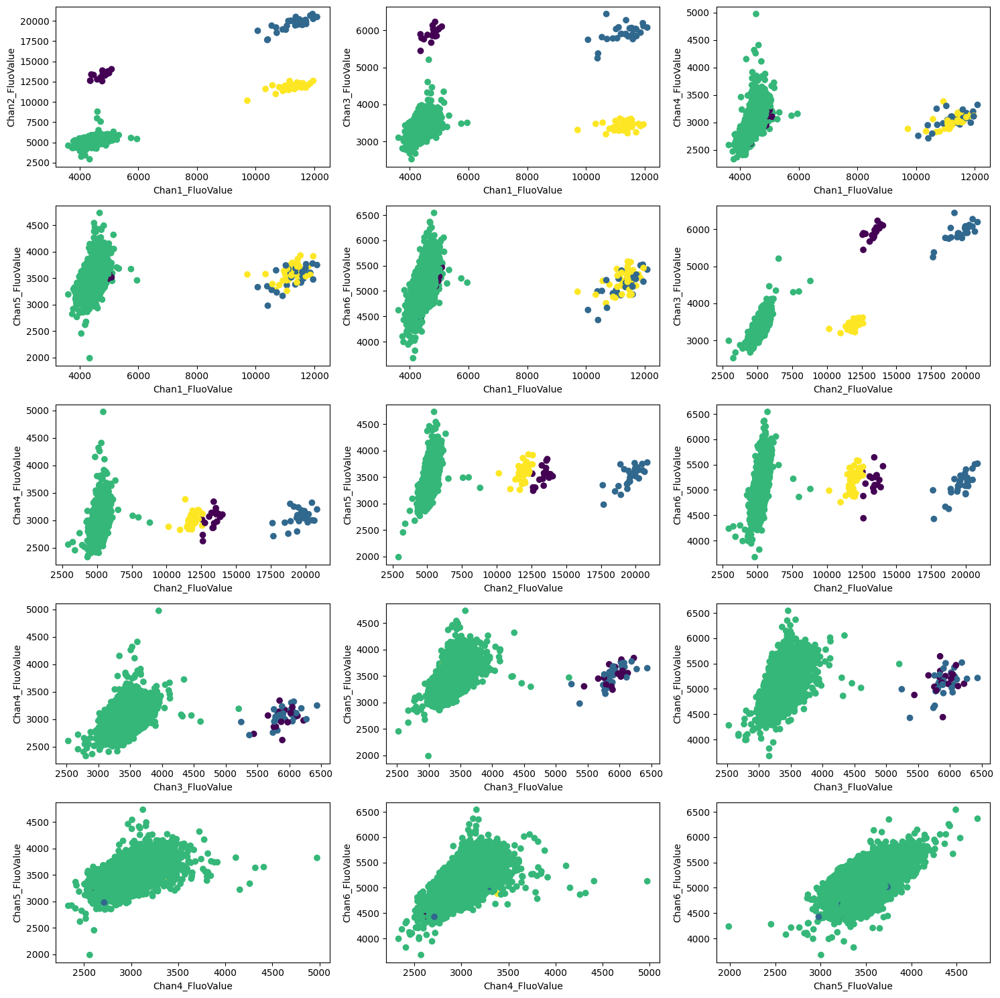

In [29]:
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

Number of outliers: 0
Number of clusters: 4


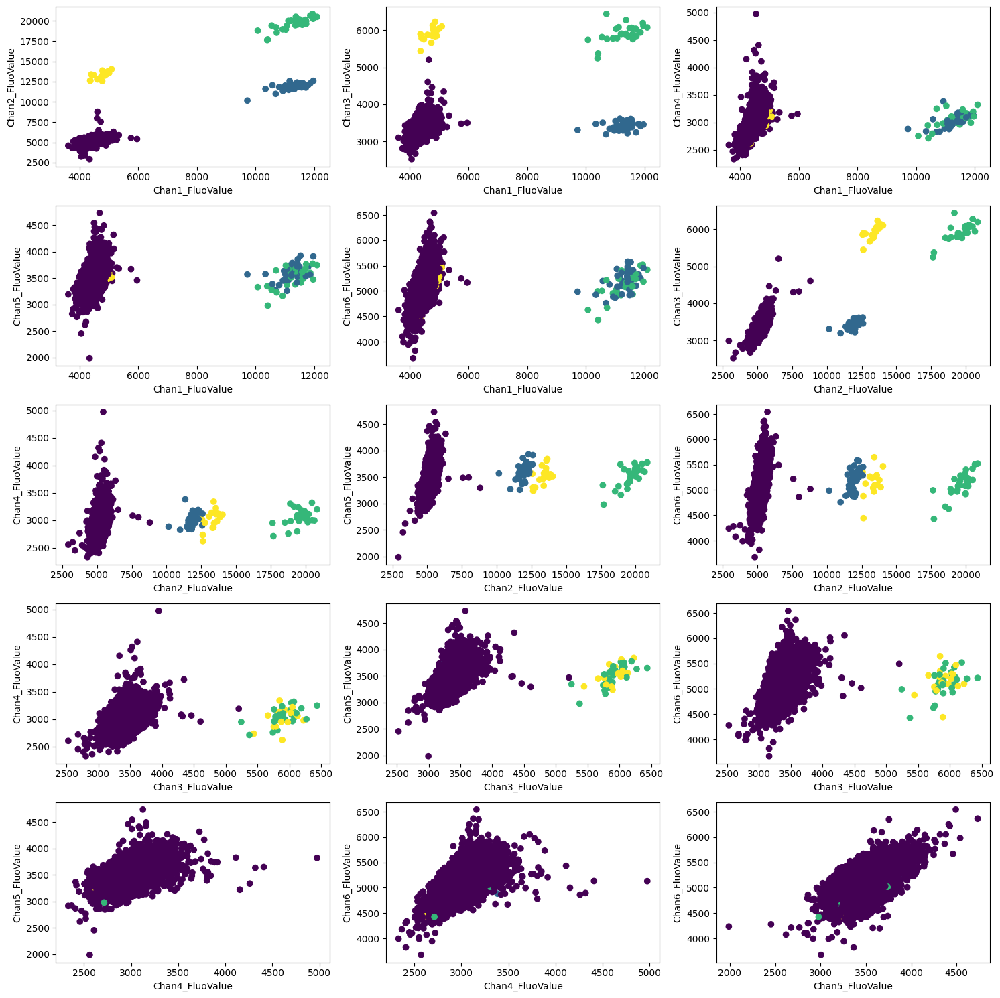

In [30]:
# UMAP 
df = data_lib.load_dataset(labels, ["wa-sa-C2"], "../Data")
umap_transform_dataset(df, features = default_features)
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.85, min_samples = 5)

# Dillution Series Data

Number of outliers: 7937
Number of clusters: 77


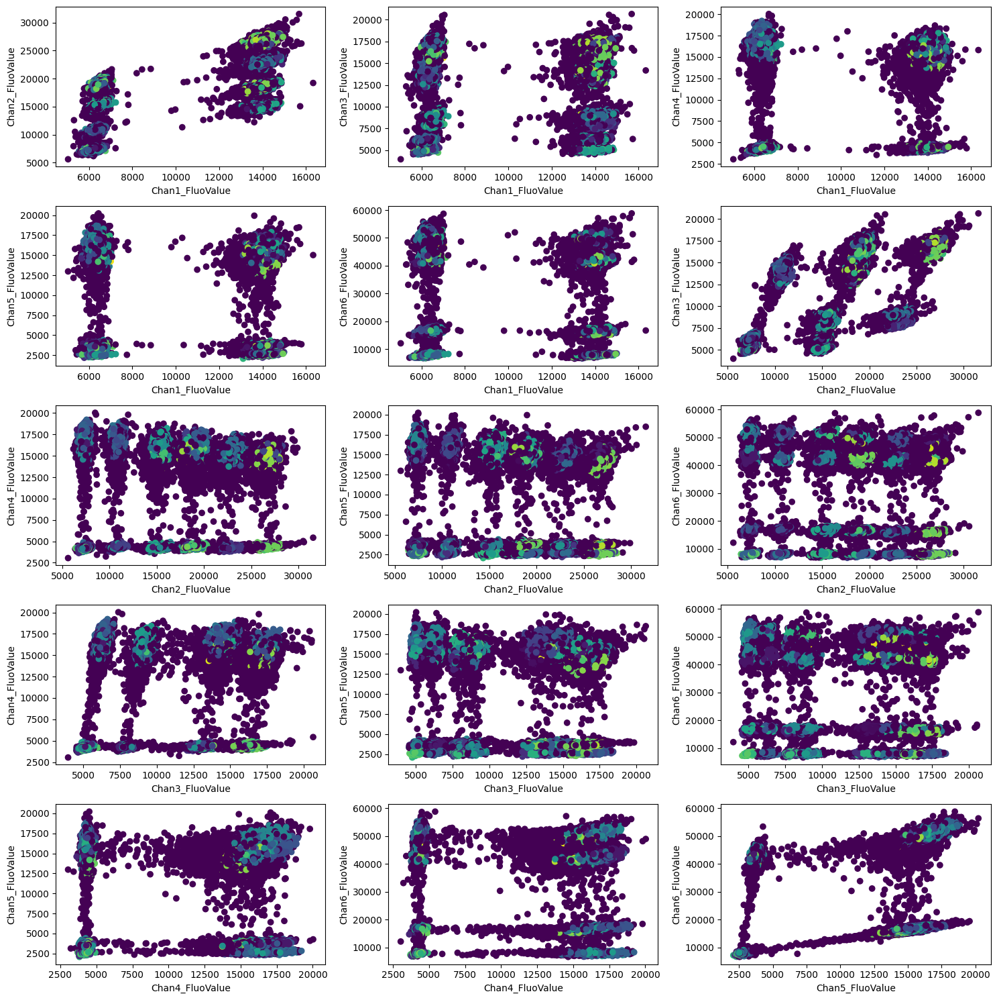

In [14]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
pairwise_plots_dbscan(df, features = default_features, eps = 700, min_samples = 10)

Number of clusters in the original data: 64


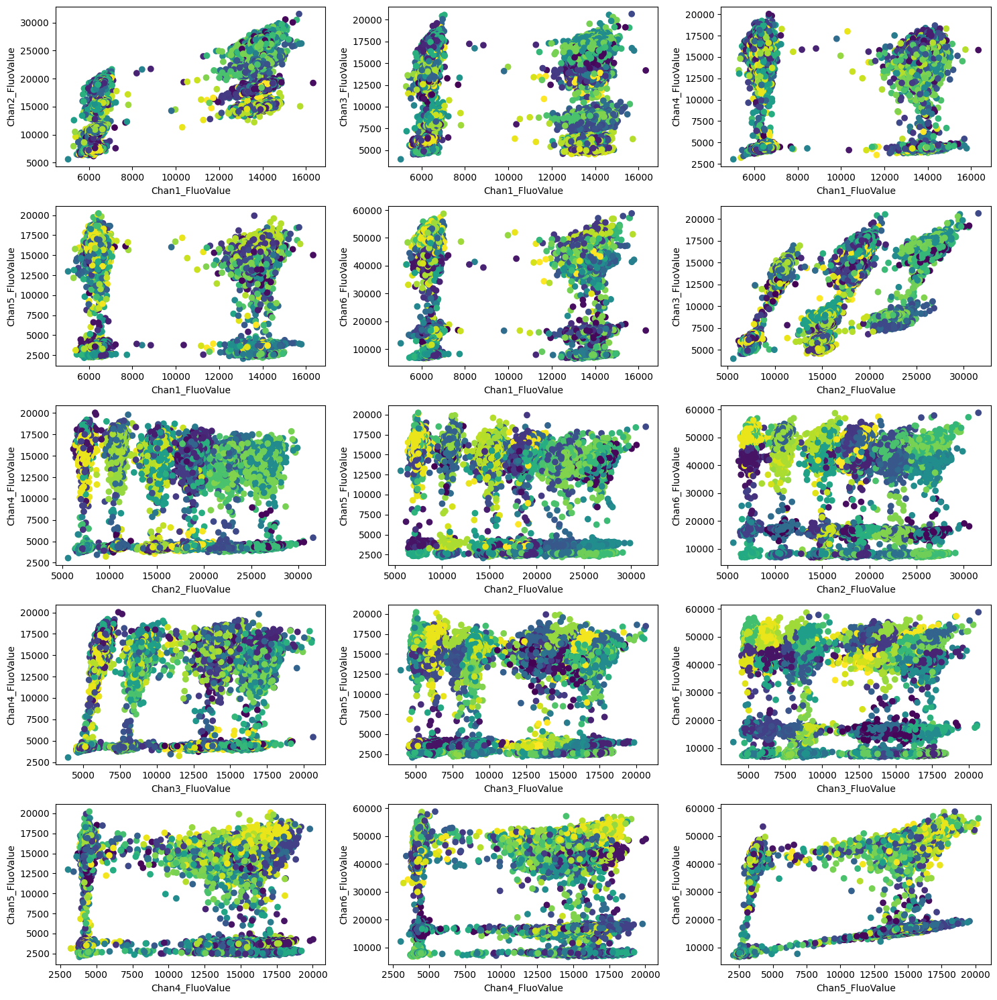

In [15]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
make_labels(df)
print(f"Number of clusters in the original data: {len(set(df['label']))}")
pairwise_plots_labels(df)

In [16]:
counts = df["label"].value_counts()
counts

IAV-M_POS MHV_POS RSV-N_POS                                      1057
IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS                            1023
IAV-M_POS MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS               837
IAV-M_POS RSV-N_POS                                               804
IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS     772
                                                                 ... 
SARS-N1_POS                                                       155
SARS-N1_POS SARS-N2_POS                                           148
SARS-N2_POS                                                       129
IBV-M_POS SARS-N1_POS                                             125
IBV-M_POS SARS-N2_POS                                             100
Name: label, Length: 64, dtype: int64

In [17]:
counts = counts.drop(counts[counts <= 5].index)
counts
print(f"Number of clusters when outliers are removed: {len(counts)}")

Number of clusters when outliers are removed: 64


In [18]:
# UMAP 
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
umap_transform_dataset(df, features = default_features)

Number of outliers: 1
Number of clusters: 64


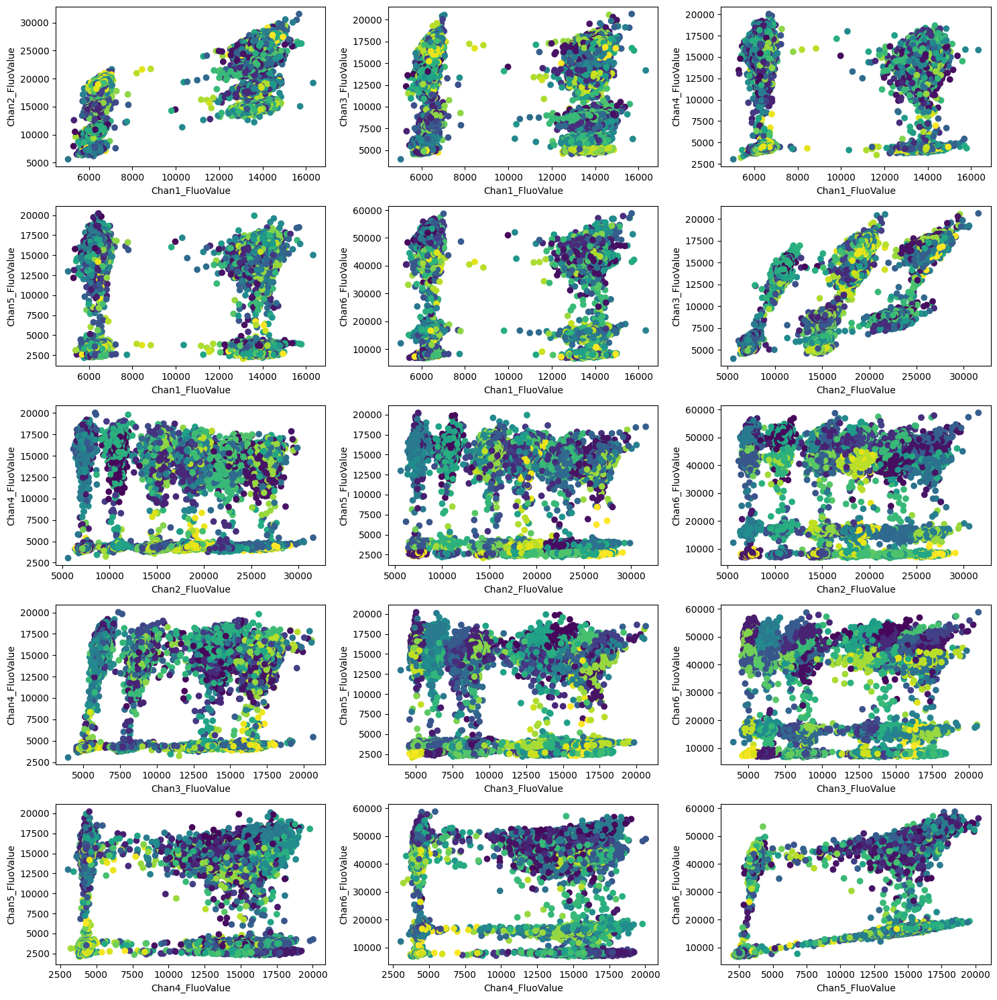

In [19]:
pairwise_plots_dbscan(df, features = ["umap1", "umap2"], eps = 0.4, min_samples = 5)

# Classifying the Clusters

In [85]:
## A3

df = data_lib.load_dataset(labels, ["wa-sa-A3"], "../Data")

In [86]:
df, _ = make_labels(df, return_dict = True)

In [87]:
df.head()

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
0,4763,5451,3742,3201,3930,5479,0,0,0,0,0,0,None,0
1,4869,5202,3424,3108,3408,5141,0,0,0,0,0,0,None,0
2,4715,5263,3376,3175,3608,4937,0,0,0,0,0,0,None,0
3,4261,5082,3396,2971,3268,4676,0,0,0,0,0,0,None,0
4,4366,5471,3681,3024,3502,5133,0,0,0,0,0,0,None,0


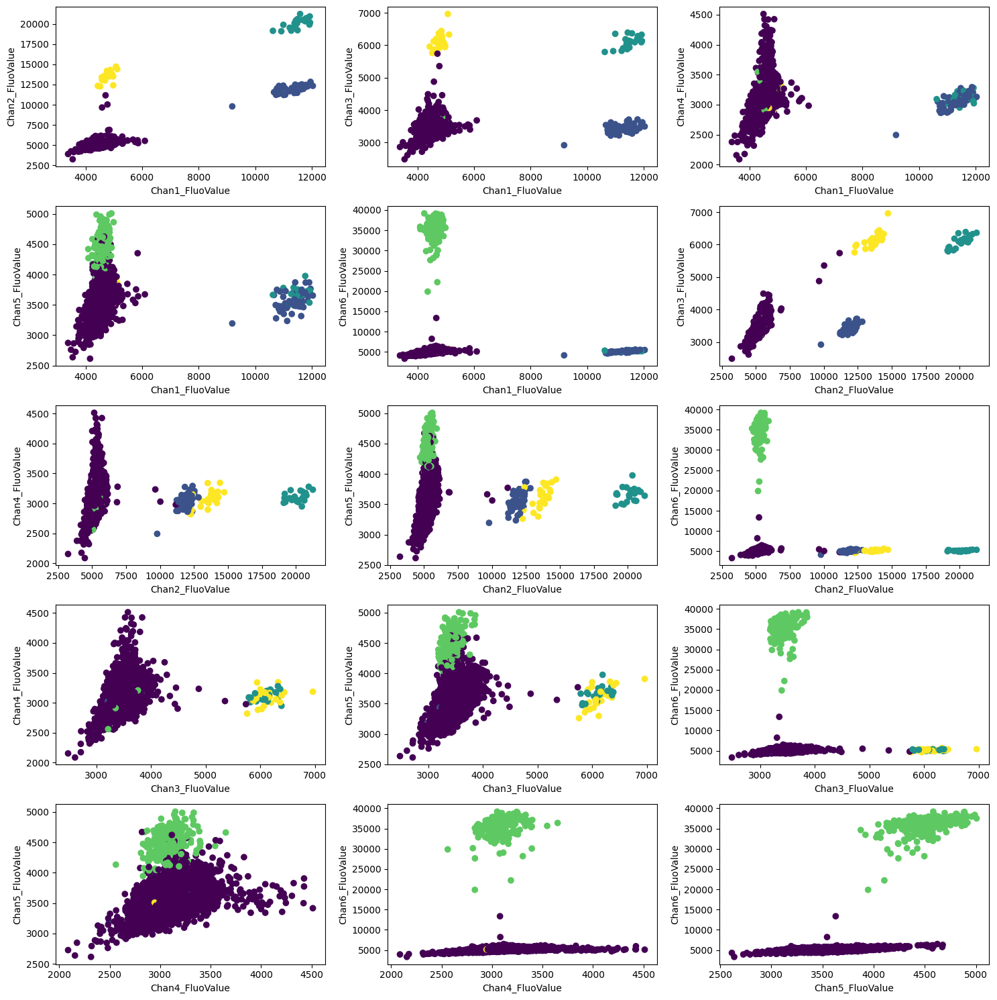

In [88]:
pairwise_plots_labels(df)

In [ ]:
 ### normalization stuff

In [89]:
import transform_lib
PCA_whitener = transform_lib.WhitenTransformer(transform_lib.Whitenings.PCA)
ZCA_whitener = transform_lib.WhitenTransformer(transform_lib.Whitenings.ZCA_COR)

In [90]:
df[channels] = ZCA_whitener.fit_transform(df[channels])

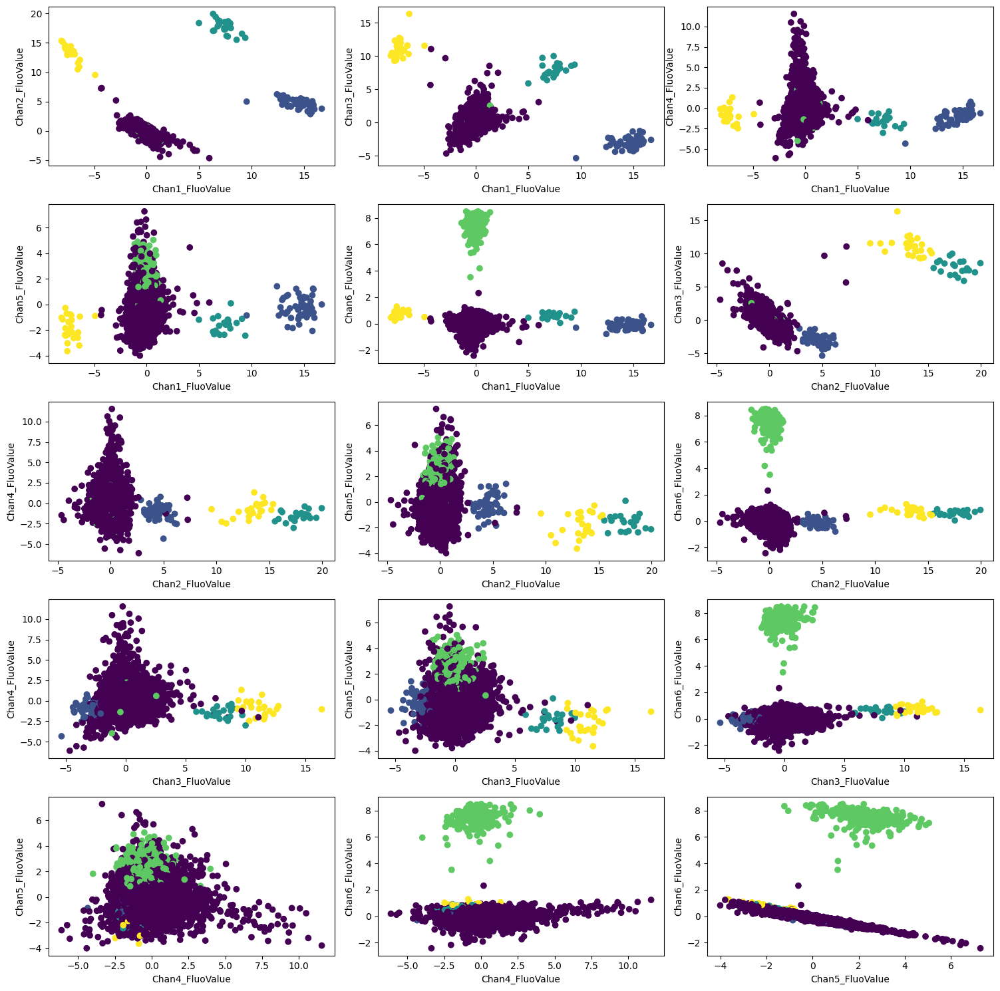

In [91]:
pairwise_plots_labels(df)

In [106]:
df[df.numerical_label == 0].head()

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
0,0.786179,-1.300070,1.899959,0.303865,1.556684,-0.498934,0,0,0,0,0,0,None,0
1,1.212087,-1.138032,0.366062,0.360939,-1.268265,0.302491,0,0,0,0,0,0,None,0
2,0.255584,-0.077011,-0.574821,0.752675,0.028079,-0.206100,0,0,0,0,0,0,None,0
3,-0.795943,0.018996,0.035909,-0.406882,-1.737812,0.307457,0,0,0,0,0,0,None,0
4,-0.555006,-0.273906,1.671081,-0.451877,-0.686038,0.129473,0,0,0,0,0,0,None,0


In [112]:
test_df = pd.DataFrame()
test_df["NEGATIVES"] = df[df.numerical_label == 0].iloc[:, :6].mean(axis = 0)
test_df["SARS N2"] = df[df.numerical_label == 1].iloc[:, :6].mean(axis = 0)
test_df["SARS N2 + SARS N1"] = df[df.numerical_label == 2].iloc[:, :6].mean(axis = 0)
test_df["MHV"] = df[df.numerical_label == 3].iloc[:, :6].mean(axis = 0)
test_df["SARS N1"] = df[df.numerical_label == 4].iloc[:, :6].mean(axis = 0)

In [113]:
test_df

,NEGATIVES,SARS N2,SARS N2 + SARS N1,MHV,SARS N1
Chan1_FluoValue,-0.041053,14.583202,7.366629,-0.075709,-7.196499
Chan2_FluoValue,-0.052051,4.557028,17.685812,-0.018600,13.249511
Chan3_FluoValue,-0.011491,-3.016934,7.945555,-0.245120,11.130546
Chan4_FluoValue,0.011527,-0.994409,-1.557731,-0.344368,-0.833080
Chan5_FluoValue,-0.033135,-0.248273,-1.603415,2.345924,-1.800671
Chan6_FluoValue,-0.122736,-0.128355,0.595027,7.456571,0.734110


In [229]:
## dil. series

df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
df, color_dict = make_labels(df, return_dict = True)
considered_labels = ['None'] + labels
colors = [color_dict[label] for label in considered_labels]
df = df[df.label.isin(considered_labels)]
inv_color_dict = {val:key for (key, val) in color_dict.items()}

In [210]:
df[channels] = ZCA_whitener.fit_transform(df[channels])

In [125]:
df.head(2)

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
3,-0.467685,-0.486661,-0.291124,1.397694,-0.563456,-0.635928,0,0,0,1,0,0,RSV-N_POS,48
32,-0.375458,-0.603906,-0.520009,-0.611812,1.298454,-0.451418,1,0,0,0,0,0,IAV-M_POS,3


In [128]:
test_df = pd.DataFrame()
for label in considered_labels:
    test_df[label] = df[df.label == label].iloc[:, :6].mean(axis=0)
test_df

,None,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS
Chan1_FluoValue,-0.407109,-0.129946,0.016201,-0.136050,-0.138689,-1.331571,3.393262
Chan2_FluoValue,-1.039776,-0.284426,-0.168924,-0.282737,-0.341148,2.910690,1.069541
Chan3_FluoValue,-0.981349,-0.286776,2.630323,-0.288017,-0.096160,-0.324169,-0.476826
Chan4_FluoValue,-1.368042,-0.320348,-0.589778,-0.328133,1.762866,-0.273919,-0.257102
Chan5_FluoValue,-1.277641,1.694264,-0.309581,-0.604244,-0.369249,-0.336180,-0.306755
Chan6_FluoValue,-1.359847,-0.125642,-0.326162,2.054347,-0.383151,-0.360883,-0.318885


# SVM

In [14]:
## dil. series

df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
df, color_dict = make_labels(df, return_dict = True)

In [18]:
import transform_lib
ZCA_whitener = transform_lib.WhitenTransformer(transform_lib.Whitenings.ZCA_COR)
X = df[channels].to_numpy()
ZCA_whitener.fit(X)
df[channels] = ZCA_whitener.transform(X)

In [19]:
df.head(3)

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
0,-0.424501,-1.079087,1.105214,0.806138,0.572105,1.068425,1,1,1,1,0,0,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS,63
1,0.492392,1.189143,-0.906973,0.710198,-1.412382,0.604476,0,0,1,1,1,1,MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS,40
2,0.481882,0.806184,0.871371,-0.264535,0.275167,0.548282,1,1,1,1,1,1,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS SARS-N1_...,50


In [20]:
from sklearn.svm import SVC
classifiers = []
for label in labels:
    temp_df = df
    y = pd.Series(np.zeros(len(df)), dtype = "int64")
    y[df[label] == 1] = 1
    y = y.to_numpy()
    X = df.iloc[:, :6].to_numpy()
    clf = SVC(kernel = "linear")
    clf.fit(X, y)
    classifiers.append(clf)

In [21]:
preds = []
for clf in classifiers:
    preds.append(clf.predict(X))

In [22]:
preds = np.array(preds).T

In [23]:
true_labels = df[labels].to_numpy()

In [24]:
true_labels

array([[1, 1, 1, 1, 0, 0],
       [0, 0, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1],
       ...,
       [0, 1, 1, 1, 0, 0],
       [1, 1, 0, 0, 1, 0],
       [1, 1, 0, 1, 0, 0]])

In [25]:
num_mistakes = 0
for i in range(len(preds)):
    if (preds[i] != true_labels[i]).sum() > 0:
        num_mistakes += 1
num_mistakes

39

In [26]:
# validation on wastewater data:

In [27]:
df = data_lib.load_dataset(labels, ["wa-sa-A3"], "../Data")

In [28]:
X = df.iloc[:, :6].to_numpy()
X = ZCA_whitener.transform(X)

In [29]:
df[channels] = X

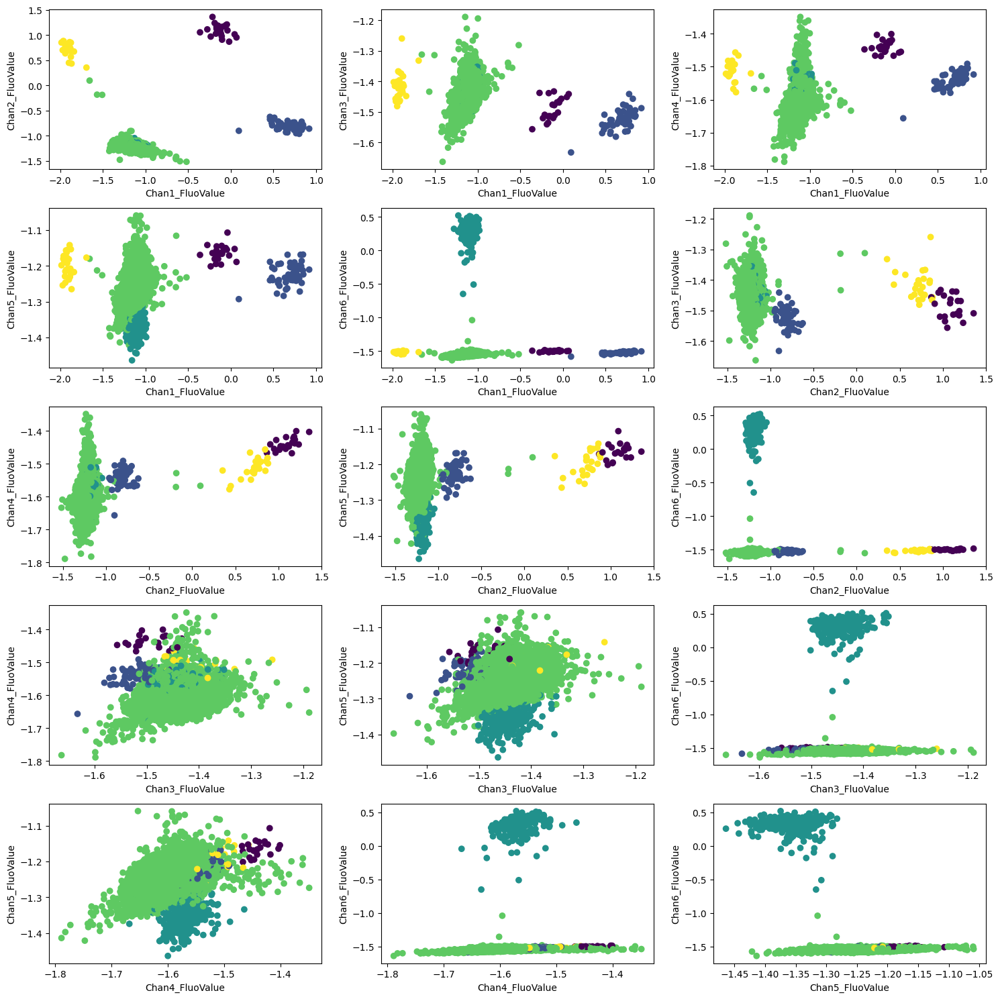

In [30]:
make_labels(df)
pairwise_plots_labels(df)

In [31]:
preds = []
for clf in classifiers:
    preds.append(clf.predict(X))

In [32]:
preds = np.array(preds).T

In [33]:
true_labels = df[labels].to_numpy()

In [34]:
num_mistakes = 0
for i in range(len(preds)):
    if (preds[i] != true_labels[i]).sum() > 0:
        num_mistakes += 1
num_mistakes

6

In [35]:
# validation on other dillution series data:

In [36]:
df = data_lib.load_dataset(labels, ["po-di-se-A8"], "../Data")

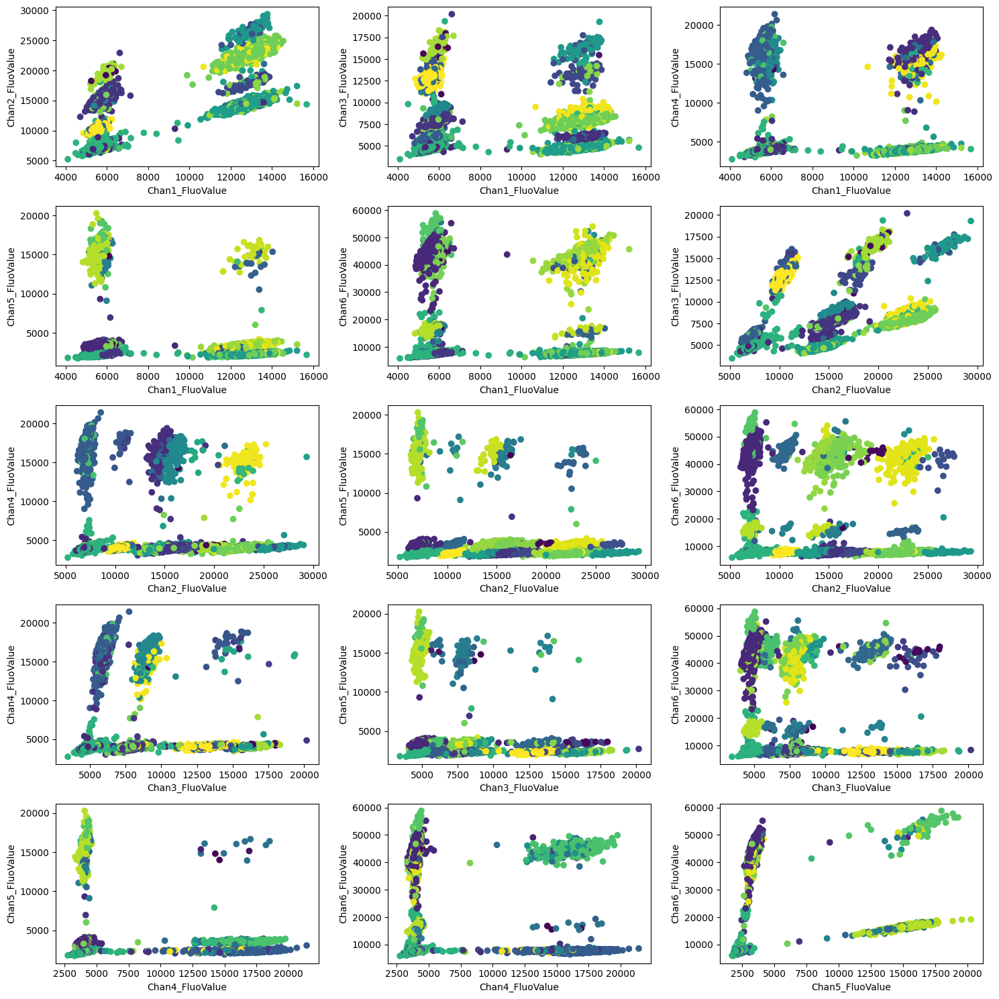

In [37]:
make_labels(df)
pairwise_plots_labels(df)

In [38]:
len(df.label.unique())

46

In [39]:
X = df.iloc[:, :6].to_numpy()
X = ZCA_whitener.transform(X)

In [40]:
df[channels] = X

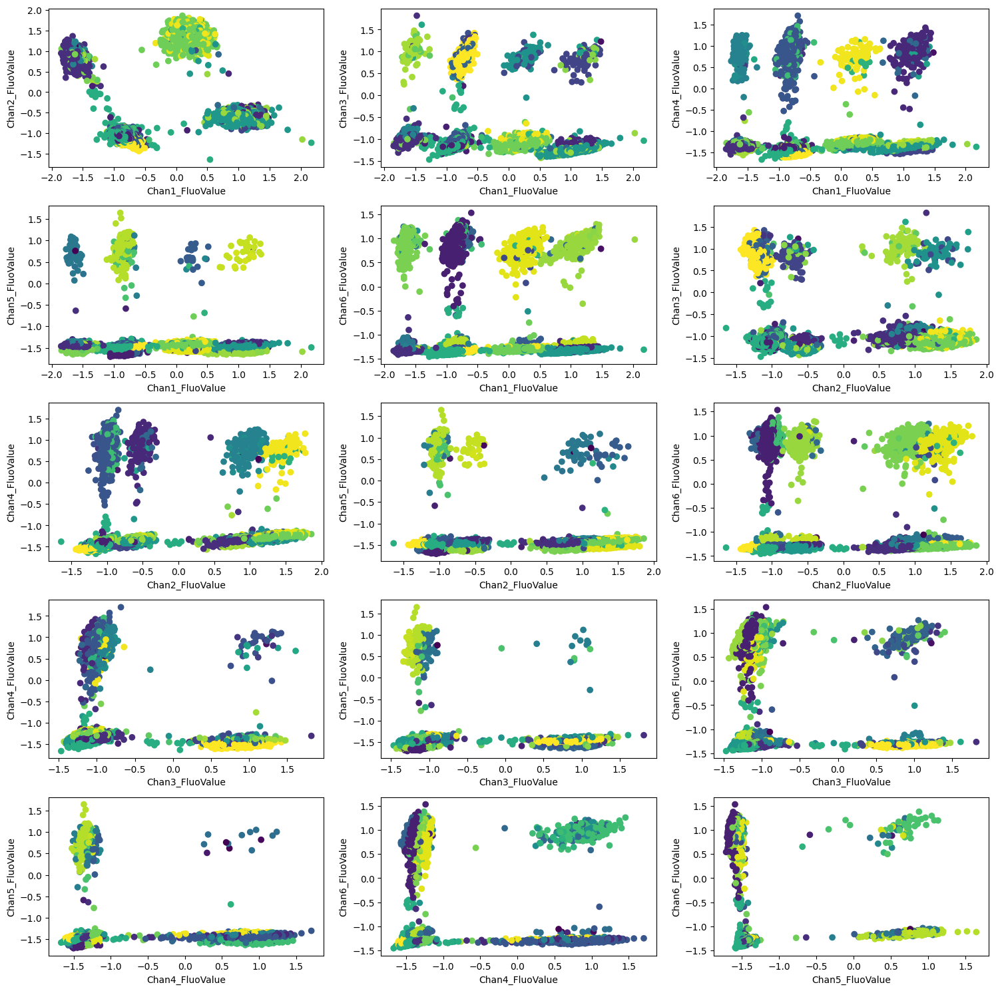

In [41]:
make_labels(df)
pairwise_plots_labels(df)

In [42]:
preds = []
for clf in classifiers:
    preds.append(clf.predict(X))

In [43]:
preds = np.array(preds).T

In [44]:
true_labels = df[labels].to_numpy()

In [45]:
num_mistakes = 0
for i in range(len(preds)):
    if (preds[i] != true_labels[i]).sum() > 0:
        num_mistakes += 1
num_mistakes

32

In [46]:
df.label.value_counts()

None                                                   13280
MHV_POS                                                 2732
SARS-N1_POS                                             2531
SARS-N2_POS                                             2475
SARS-N1_POS SARS-N2_POS                                 1548
RSV-N_POS                                                695
MHV_POS SARS-N2_POS                                      506
MHV_POS SARS-N1_POS                                      506
IBV-M_POS                                                485
MHV_POS SARS-N1_POS SARS-N2_POS                          321
IAV-M_POS                                                200
RSV-N_POS SARS-N1_POS                                    145
MHV_POS RSV-N_POS                                        133
RSV-N_POS SARS-N2_POS                                    128
IBV-M_POS SARS-N1_POS                                     96
IBV-M_POS MHV_POS                                         89
IBV-M_POS SARS-N2_POS   

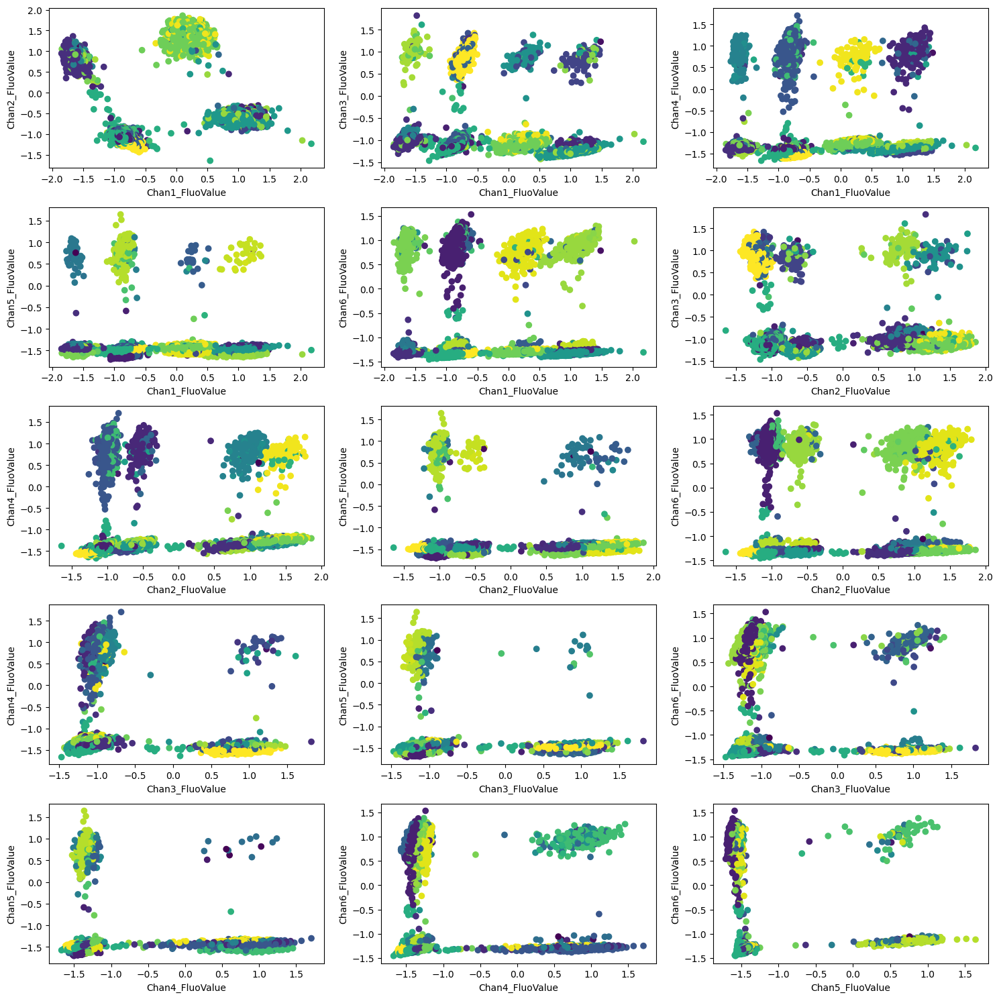

In [47]:
combinations = itertools.combinations(channels, 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = df.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    sc = ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = df["numerical_label"])

    lp = lambda j: ax[i //3, i %3].plot([],color=sc.cmap(sc.norm(j)), mec="none",
                            label=inv_color_dict[j], ls="", marker="o")[0]
#     if i == 0:
#         handles = [lp(j) for j in np.unique(df["numerical_label"])]
#         ax[i //3, i %3].legend(handles=handles)
        
    fig.tight_layout()

# SVM but only single positives

In [182]:
## dil. series

df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
df, color_dict = make_labels(df, return_dict = True)

In [183]:
import transform_lib
ZCA_whitener = transform_lib.WhitenTransformer(transform_lib.Whitenings.ZCA_COR)
X = df[channels].to_numpy()
ZCA_whitener.fit(X)
df[channels] = ZCA_whitener.transform(X)

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
0,-0.424501,-1.079087,1.105214,0.806138,0.572105,1.068425,1,1,1,1,0,0,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS,5
1,0.492392,1.189143,-0.906973,0.710198,-1.412382,0.604476,0,0,1,1,1,1,MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS,36
2,0.481882,0.806184,0.871371,-0.264535,0.275167,0.548282,1,1,1,1,1,1,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS SARS-N1_...,31


In [185]:
from sklearn.svm import SVC
import random
classifiers = []
for label in labels:
    temp_df = df
    mask = df.numerical_label == color_dict[label]

#     X_1 = df[mask].iloc[:, :6].to_numpy()
#     X_2 = df[df[label] == 0].iloc[:, :6].to_numpy()
#     y = np.zeros(len(X_1) + len(X_2), dtype = np.uint64)
#     y[:len(X_1)] = 1
#     X = np.zeros((len(X_1) + len(X_2), 6))
#     X[:len(X_1)] = X_1
#     X[len(X_1):]= X_2
    
    npos = mask.sum()
    nneg = int(0.1*npos)
    ntotal = npos + nneg
    y = np.zeros(ntotal)
    y[:npos] = 1
    X_1 = df[mask].iloc[:, :6].to_numpy()
    rand_subset = random.sample(df[df[label] == 0].iloc[:, :6].index.tolist(), nneg)
    X_2 = df.loc[rand_subset].iloc[:, :6].to_numpy()
    X = np.zeros((ntotal, 6))
    X[:npos] = X_1
    X[npos:] = X_2
    clf = SVC(kernel = "linear")
    clf.fit(X, y)
    classifiers.append(clf)

In [186]:
preds = []
for clf in classifiers:
    preds.append(clf.predict(X))

In [187]:
preds = np.array(preds).T

In [188]:
true_labels = df[labels].to_numpy()

In [189]:
true_labels

array([[1, 1, 1, 1, 0, 0],
       [0, 0, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1],
       ...,
       [0, 1, 1, 1, 0, 0],
       [1, 1, 0, 0, 1, 0],
       [1, 1, 0, 1, 0, 0]])

In [190]:
num_mistakes = 0
for i in range(len(preds)):
    if (preds[i] != true_labels[i]).sum() > 0:
        num_mistakes += 1
num_mistakes

140

In [191]:
df = data_lib.load_dataset(labels, ["po-di-se-A8"], "../Data")
df = make_labels(df)

In [192]:
len(df.label.unique())

46

In [193]:
X = df.iloc[:, :6].to_numpy()
X = ZCA_whitener.transform(X)

In [194]:
df[channels] = X

In [195]:
preds = []
for clf in classifiers:
    preds.append(clf.predict(X))

In [196]:
preds = np.array(preds).T

In [197]:
true_labels = df[labels].to_numpy()

In [198]:
num_mistakes = 0
for i in range(len(preds)):
    if (preds[i] != true_labels[i]).sum() > 0:
        num_mistakes += 1
num_mistakes

14443

In [123]:
# only plot datapoints with a single label

In [114]:
# positive dillution series
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")

In [115]:
df, color_dict = make_labels(df, return_dict = True)

In [116]:
considered_labels = ['None'] + labels

In [117]:
colors = [color_dict[label] for label in considered_labels]

In [118]:
df = df[df.label.isin(considered_labels)]

In [119]:
inv_color_dict = {val:key for (key, val) in color_dict.items()}

In [120]:
df.head(3)

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
3,5710,7010,6136,16077,2556,7045,0,0,0,1,0,0,RSV-N_POS,48
32,5811,6710,4808,3989,14430,15205,1,0,0,0,0,0,IAV-M_POS,3
47,6261,10961,13386,4455,2708,8153,0,1,0,0,0,0,IBV-M_POS,10


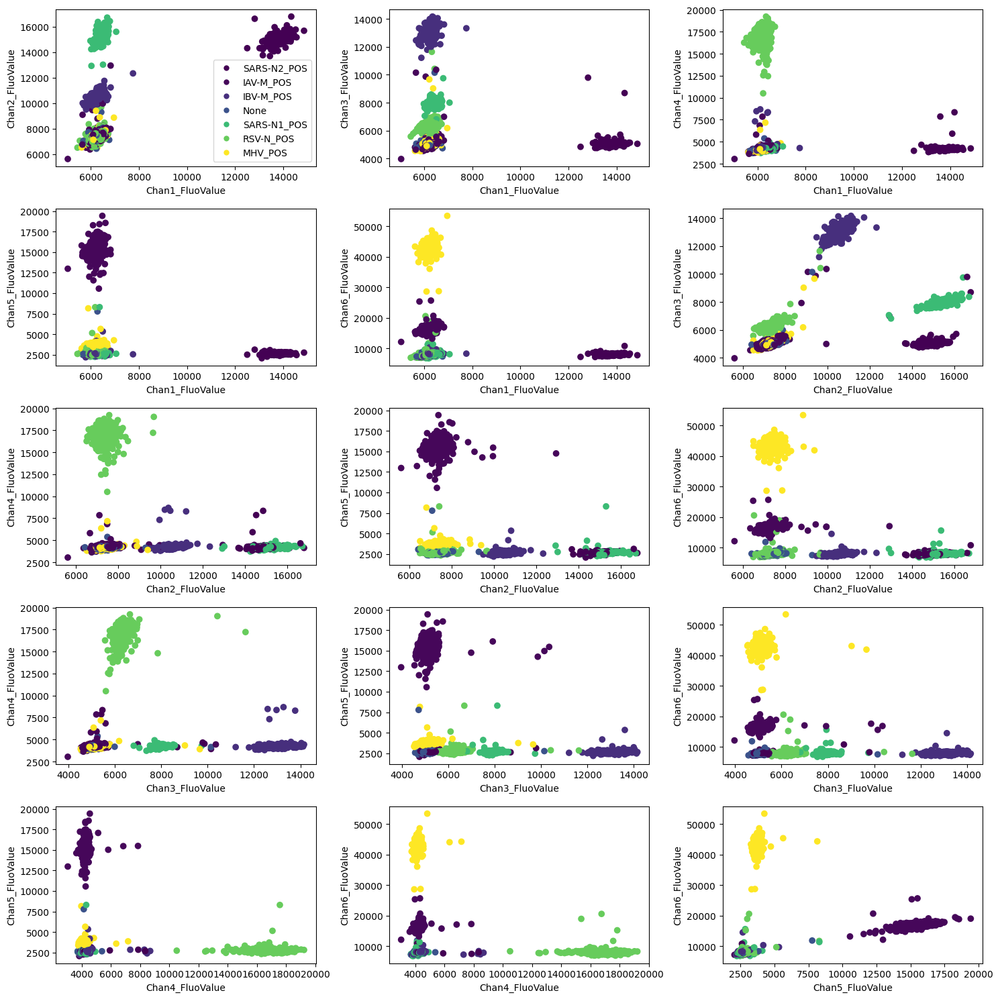

In [81]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = df.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    sc = ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = df["numerical_label"])

    lp = lambda j: ax[i //3, i %3].plot([],color=sc.cmap(sc.norm(j)), mec="none",
                            label=inv_color_dict[j], ls="", marker="o")[0]
    if i == 0:
        handles = [lp(j) for j in np.unique(df["numerical_label"])]
        ax[i //3, i %3].legend(handles=handles)
        
    fig.tight_layout()

In [106]:
# looks like channel 1 being active makes channel 2 really large as well
# lets include points that are active in both channels simultaneously to see how they look like

In [191]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")

In [192]:
df, color_dict = make_labels(df, return_dict = True)

In [193]:
considered_labels = ['None', 'SARS-N1_POS', 'SARS-N2_POS', 'SARS-N1_POS SARS-N2_POS']

In [194]:
colors = [color_dict[label] for label in considered_labels]

In [195]:
df = df[df.label.isin(considered_labels)]

In [196]:
inv_color_dict = {val:key for (key, val) in color_dict.items()}

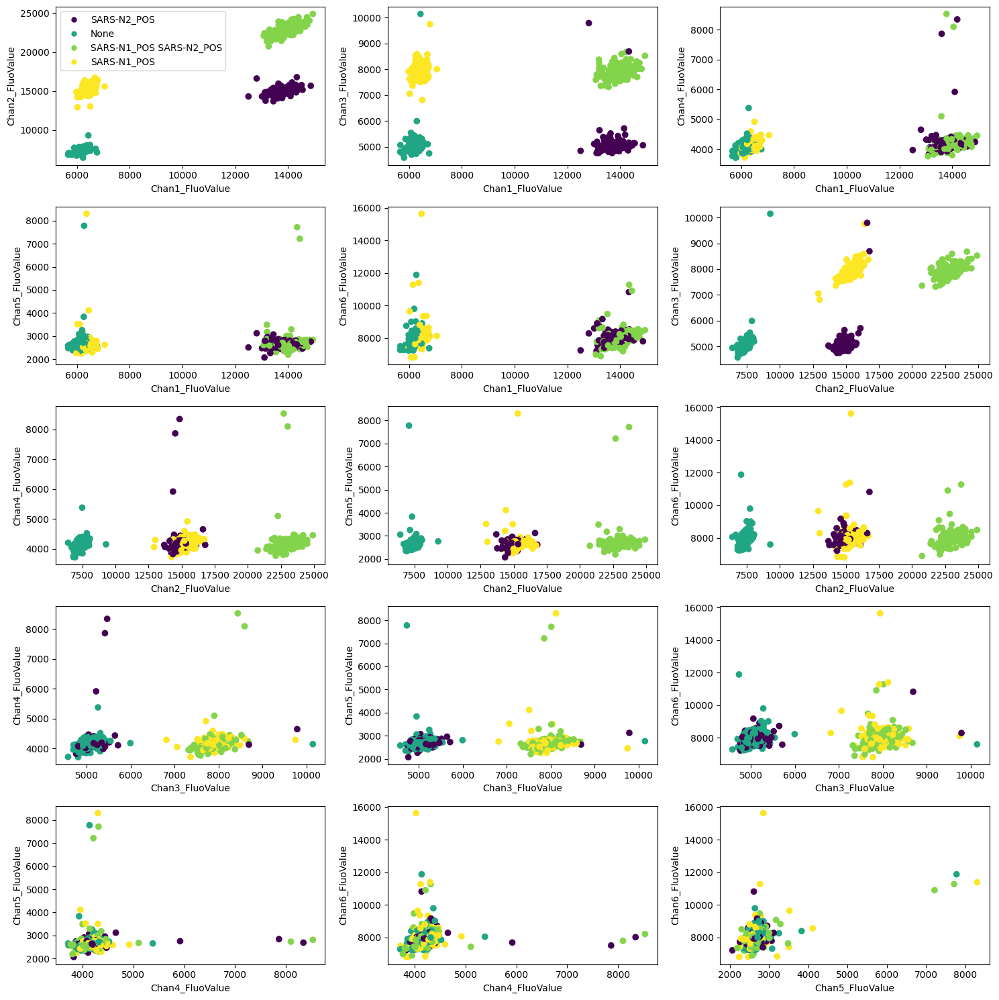

In [197]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = df.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    sc = ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = df["numerical_label"])

    lp = lambda j: ax[i //3, i %3].plot([],color=sc.cmap(sc.norm(j)), mec="none",
                            label=inv_color_dict[j], ls="", marker="o")[0]
    if i == 0:
        handles = [lp(j) for j in np.unique(df["numerical_label"])]
        ax[i //3, i %3].legend(handles=handles)
        
    fig.tight_layout()

## Random Forest Test

In [281]:
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")

In [282]:
df, label_dict = make_labels(df, return_dict = True)

In [296]:
inv_label_dict = {label: key for (key, label) in label_dict.items()}

In [283]:
umap_transform_dataset(df, features = default_features)

In [284]:
from sklearn.ensemble import RandomForestClassifier

In [285]:
clf = RandomForestClassifier()

In [286]:
X = df[channels].to_numpy()
y = df["numerical_label"].to_numpy()

In [287]:
clf.fit(X, y)

RandomForestClassifier()

In [288]:
clf.predict(X)

array([53, 17, 50, ..., 55, 39, 22])

In [289]:
(y != clf.predict(X)).sum()

0

In [290]:
df = data_lib.load_dataset(labels, ["wa-sa-A3"], "../Data")
df = make_labels(df)

In [291]:
df.label.value_counts()

None                       18546
MHV_POS                      302
SARS-N2_POS                   55
SARS-N1_POS                   25
SARS-N1_POS SARS-N2_POS       22
Name: label, dtype: int64

In [292]:
y_pred = clf.predict(df[channels].to_numpy())

In [295]:
y_pred

array([41, 41, 41, ..., 41, 41, 41])

In [301]:
df['preds'] = np.vectorize(inv_label_dict.get)(y_pred)

# TESTING THE ACCURACY OF THE CLUSTERS

What I am doing here is assigning every predicted cluster to the real cluster it shares most data points with. I then say that the error is the total number of data points that are in the predicted cluster but not in the real cluster that the predicted cluster is most similar to.

In [218]:
# creating the true labels
df = data_lib.load_dataset(labels, ["po-di-se-1-A4"], "../Data")
make_labels(df)

,Chan1_FluoValue,Chan2_FluoValue,Chan3_FluoValue,Chan4_FluoValue,Chan5_FluoValue,Chan6_FluoValue,IAV-M_POS,IBV-M_POS,MHV_POS,RSV-N_POS,SARS-N1_POS,SARS-N2_POS,label,numerical_label
0,6485,10956,14510,16519,15651,51835,1,1,1,1,0,0,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS,4
1,13431,22311,8956,14851,3726,38750,0,0,1,1,1,1,MHV_POS RSV-N_POS SARS-N1_POS SARS-N2_POS,15
2,12645,23505,15614,9893,13308,42148,1,1,1,1,1,1,IAV-M_POS IBV-M_POS MHV_POS RSV-N_POS SARS-N1_...,21
3,5710,7010,6136,16077,2556,7045,0,0,0,1,0,0,RSV-N_POS,5
4,6089,7211,5154,4188,16749,48333,1,0,1,0,0,0,IAV-M_POS MHV_POS,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25689,5986,7231,6139,15898,14269,16541,1,0,0,1,0,0,IAV-M_POS RSV-N_POS,54
25690,6413,14556,8721,13352,13208,48165,1,0,1,1,1,0,IAV-M_POS MHV_POS RSV-N_POS SARS-N1_POS,45
25691,6621,10960,14225,15451,3290,41706,0,1,1,1,0,0,IBV-M_POS MHV_POS RSV-N_POS,42
25692,6423,18964,16348,4528,14183,16707,1,1,0,0,1,0,IAV-M_POS IBV-M_POS SARS-N1_POS,3


In [219]:
# building dictionary
real_clusters = {}
for i in set(df.numerical_label):
    real_clusters[i] = df.numerical_label[df.numerical_label == i].index.tolist()

In [220]:
# making the predictions for clusters
umap_transform_dataset(df, features = default_features)
X = df[["umap1", "umap2"]].to_numpy()
preds = do_db_scan_preds(X, eps = 0.4, min_samples = 5)

In [221]:
df["preds"] = preds

In [223]:
max(preds)+1

64

In [224]:
# building dictionary
predicted_clusters = {}
for i in set(df.preds):
    predicted_clusters[i] = df.preds[df.preds == i].index.tolist()

In [225]:
def most_similar_cluster(cluster1, clusters):
    """
    cluster1: list
    clusters: dictionary where the items are lists
    --
    
    returns:
        best_cluster: the real cluster that shares the highest amount of datapoints with cluster1
        best_sim: the number of data points shared between cluster1 and best_cluster
    """
    best_sim = 0
    best_cluster = 0
    
    for (key, cluster) in clusters.items():
        similarity = len(set(cluster1).intersection(cluster))
        if similarity > best_sim:
            best_sim = similarity
            best_cluster = key

    return best_cluster, best_sim

In [251]:
num_wrongly_classified = 0
# go through all predicted clusters
cluster_map = {}
for (key, cluster) in predicted_clusters.items():
    best_cluster, best_sim = most_similar_cluster(cluster, real_clusters)
    num_wrongly_classified += len(cluster) - best_sim
    cluster_map[key] = (best_cluster, len(cluster) - best_sim)

In [252]:
num_wrongly_classified

155

In [228]:
test = df.loc[df[df.preds.isin([0, 1, 2, 3])].index]

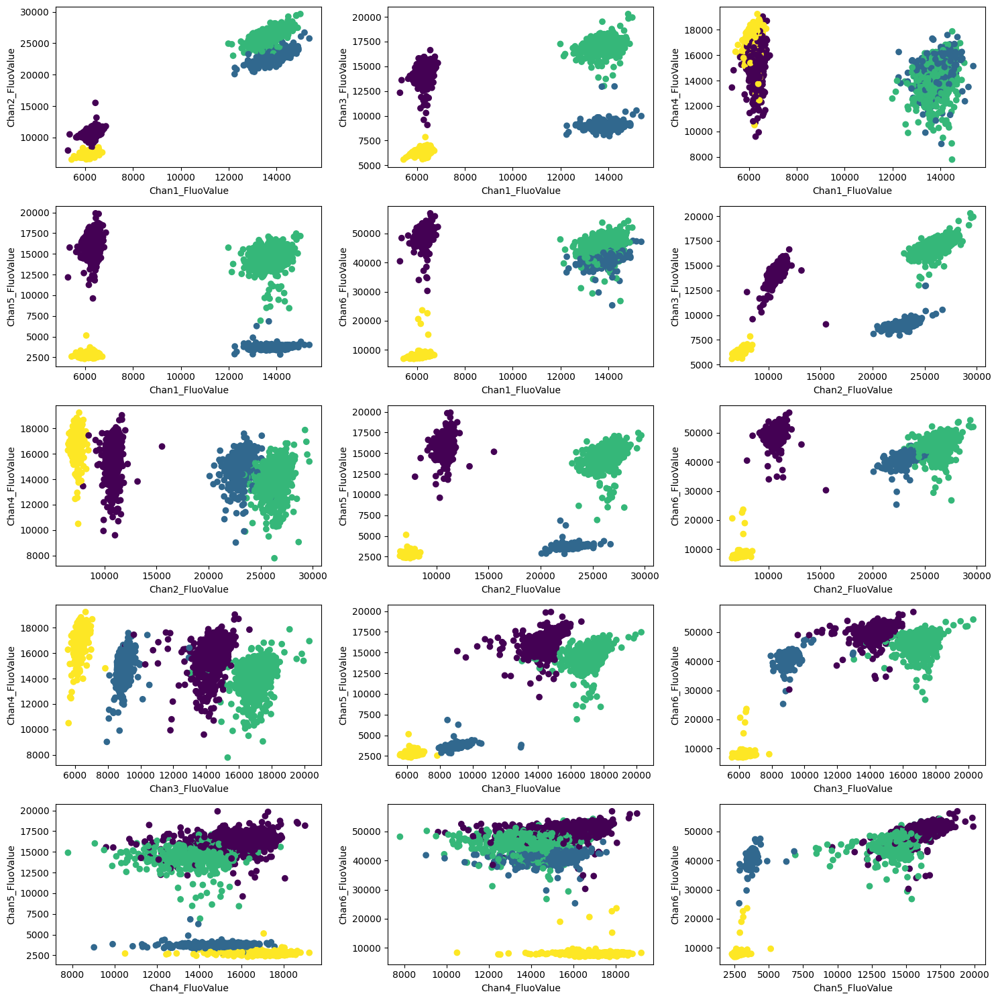

In [229]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = test.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = test["preds"])
fig.tight_layout()

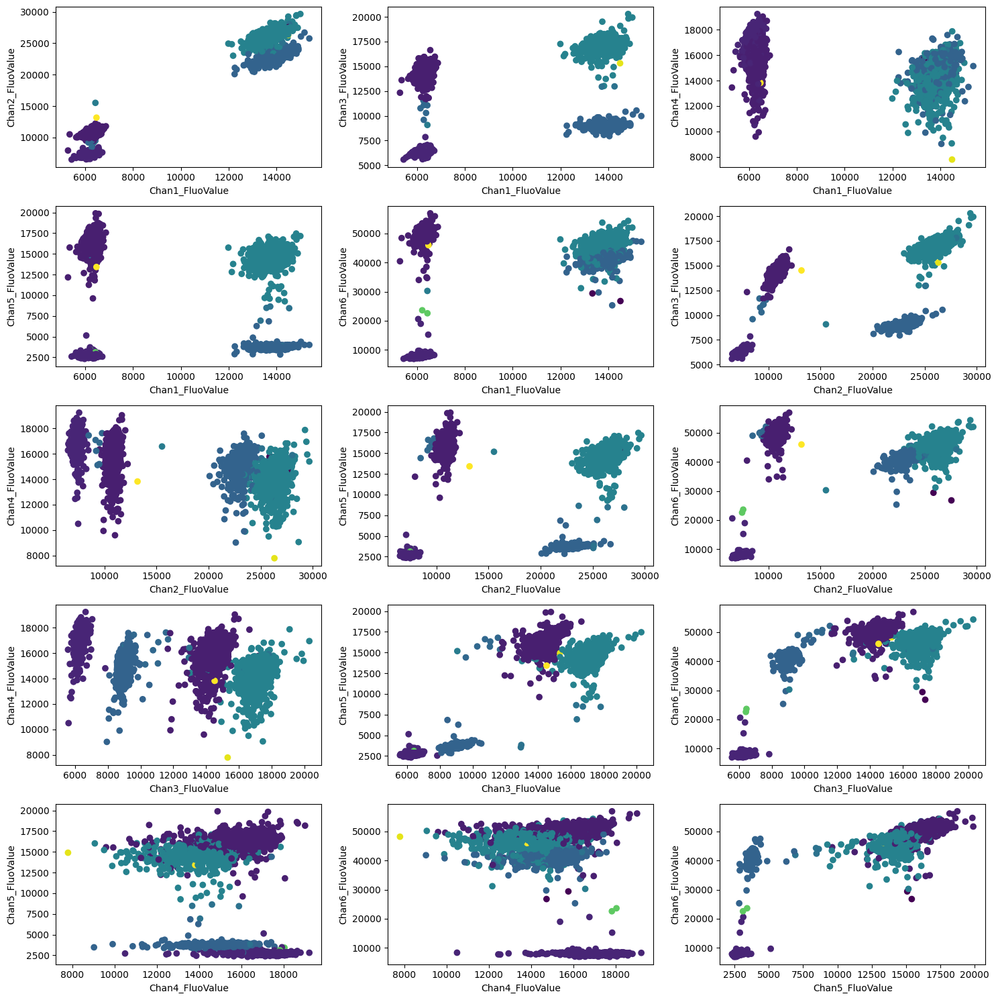

In [230]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = test.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = test["numerical_label"])
fig.tight_layout()

## Where are the biggest mistakes being made?

In [254]:
for i in range(len(cluster_map)-1):
    print(f"{i}: {cluster_map[i][1]}")

0: 9
1: 2
2: 7
3: 2
4: 0
5: 5
6: 4
7: 3
8: 0
9: 1
10: 8
11: 0
12: 3
13: 0
14: 3
15: 0
16: 0
17: 1
18: 7
19: 2
20: 1
21: 8
22: 0
23: 0
24: 1
25: 5
26: 0
27: 2
28: 4
29: 2
30: 3
31: 1
32: 1
33: 2
34: 0
35: 0
36: 4
37: 3
38: 0
39: 3
40: 4
41: 2
42: 26
43: 0
44: 0
45: 4
46: 0
47: 0
48: 0
49: 0
50: 0
51: 0
52: 1
53: 5
54: 8
55: 2
56: 0
57: 0
58: 4
59: 0
60: 0
61: 0
62: 0
63: 1


## Testing Subsets of the Predicted Clusters

In [320]:
c = [26, 0, 10] # select the predicted clusters you want to visualize

In [321]:
test = df.loc[df[df.preds.isin(c)].index]

In [322]:
len(test)

1752

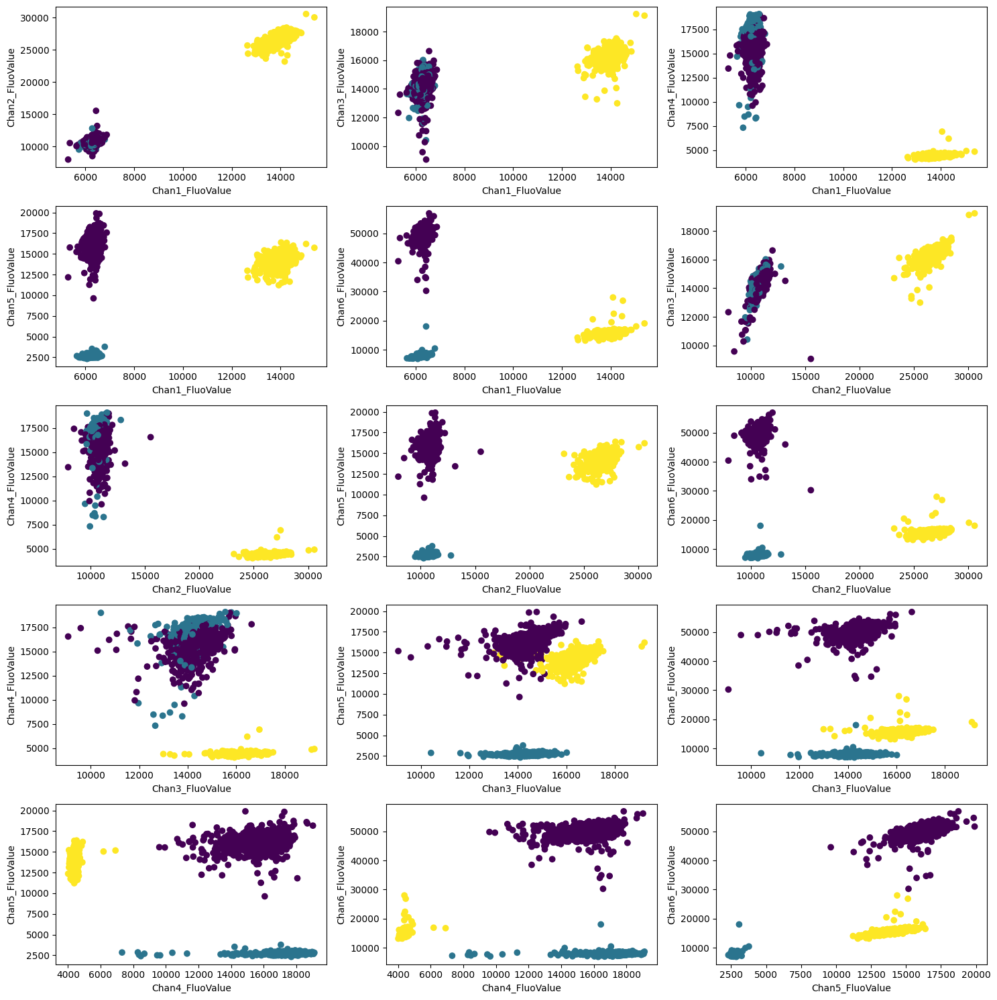

In [323]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = test.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = test["preds"])
fig.tight_layout()

In [324]:
set(test["numerical_label"]) # the true clusters that the datapoints from the predicted clusters take part in

{4, 5, 9, 16, 20, 32, 40, 48, 51}

In [325]:
p = [cluster_map[i][0] for i in c] # get the predicted clusters
p

[40, 4, 9]

In [326]:
test = df[(df.numerical_label.isin(p) | df.preds.isin(c))]

In [327]:
len(test)

1758

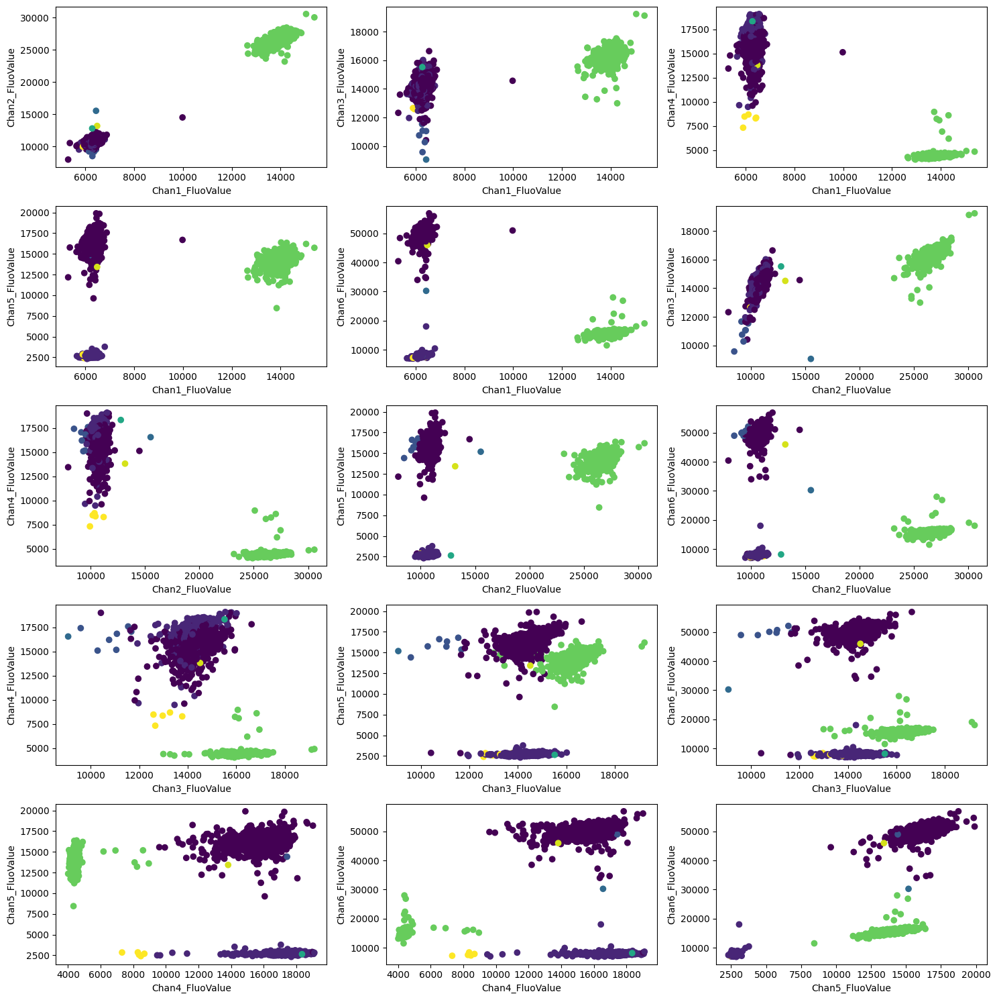

In [328]:
combinations = itertools.combinations(df[channels], 2)
fig, ax = plt.subplots(5, 3, sharex=False, sharey=False)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, combination in enumerate(combinations): 
    X = test.loc[:, combination]
    X = X.to_numpy()

    ax[i //3, i %3].set_xlabel(combination[0])
    ax[i //3, i %3].set_ylabel(combination[1])
    ax[i //3, i %3].scatter(X[:, 0], X[:, 1], c = test["numerical_label"])
fig.tight_layout()

In [315]:
# results look really promising

### Outlier 

In [316]:
from sklearn.ensemble import IsolationForest
iso = IsolationForest(contamination = .01, n_estimators = 1000, )
yhat = iso.fit_predict(df[default_features].to_numpy())

In [338]:
yhat = pd.Series(yhat, dtype = "boolean")

In [329]:
test = df[(df.numerical_label.isin(p) | df.preds.isin(c)) & yhat]

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

# Remarks and Ideas to Try Out

* I still dont really understand what the PCA decorrelation does. Not on a theoretical level, and also not to our specific data. Is it useful to check this out further?

* One can think of quite a few other criterions that measure how good a clustering is. Maybe think of some and implement some and see if they all perform quite well